In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Preparing Datasets

In [2]:
df_harvard = pd.read_csv('./data/harvard_feature_engineered.csv', sep=';', decimal=',')
df_triage = pd.read_csv('./data/triage_feature_engineered.csv', sep=';', decimal=',')

df_triage.dropna(subset=['Exacerbation'], inplace=True)
df_harvard.dropna(subset=['Exacerbation'], inplace=True)
# only consider the first 8 assessments
df_harvard = df_harvard[df_harvard['Assmnt'] <= 8]
df_harvard.drop(columns=['Assmnt'], inplace=True)

relevant_harvard_vars = [ '% FEV1 b', 'Age', 'Height', 'Weight', 'BMI', 'MMRC', 'Exacerbation', 'GOLD', 'Coronary Artery Disease', 'Gender, Male', 'Diabetes', 'Kidney disease', 'Congestive Heart Failure', 'Hypertension', 'Oxygen Therapy', 'ICU last year', 'Asthma', 'Hospitalized last year', '2+ Exa. last year', 'Daily Inhaler', 'Lives Alone', 'Pill to control Exa.', 'Rescue Inhaler', 'Night Symptoms', 'Increase in sputum','Fever', 'Worse cough', 'Worse dyspnea'] #'% FEV1 a',
relevant_triage_vars = ['% FEV1 b',  'Age', 'Height', 'Weight', 'BMI', 'MMRC b', 'Exacerbation', 'GOLD', 'Coronary Artery Disease', 'Gender, Male', 'Diabetes', 'Kidney disease', 'Congestive Heart Failure', 'Hypertension', 'Oxygen Therapy', 'ICU last year', 'Asthma', 'Hospitalized last year', '2+ Exa. last year', 'Daily Inhaler', 'Lives Alone', 'Pill to control Exa.', 'Rescue Inhaler', 'Night Symptoms', 'Increase in sputum','Fever', 'Worse cough', 'Worse dyspnea']

# get all columns with the same names in both datasets
df_harvard = df_harvard[relevant_harvard_vars]
df_triage = df_triage[relevant_triage_vars]
df_triage.rename(columns={ 'MMRC b': 'MMRC'}, inplace=True)


# Visualize Features

In [28]:
# create a scatter plot of each variable against another variable
variables_to_show = shared_columns
variables_to_show.remove('Exacerbation')
fig, axs = plt.subplots(28, 28, figsize=(150, 150))
for i in range(28):
    for j in range(28):
        if i == j:
            pass
            # # create a list of the current variable and the exacerbation variable
            # subset = df_harvard[[shared_columns[i], 'Exacerbation']]
            # sns.histplot(data=subset, ax=axs[i, j], kde=True, hue='Exacerbation')
            # axs[i, j].set_title(shared_columns[i])
        else:
            axs[i, j].scatter(df_harvard[variables_to_show[i]], df_harvard[variables_to_show[j]], c=df_harvard['Exacerbation'], )
            axs[i, j].set_title(variables_to_show[i] + ' vs ' + variables_to_show[j])

In [12]:
# perform quantile transformation for all numeric variables
numeric_columns = ['% FEV1 b', 'Age', 'Height', 'Weight', 'BMI', 'MMRC', 'GOLD']
for column in numeric_columns:
    transformer = QuantileTransformer(n_quantiles=100, random_state=0, output_distribution='normal')
    df_harvard[column] = transformer.fit_transform(df_harvard[column].values.reshape(-1, 1))
    df_triage[column] = transformer.transform(df_triage[column].values.reshape(-1, 1))

# create a scatter plot of each variable against another variable
variables_to_show = shared_columns
variables_to_show.remove('Exacerbation')
fig, axs = plt.subplots(28, 28, figsize=(150, 150))
for i in range(28):
    for j in range(28):
        if i == j:
            pass
            # # create a list of the current variable and the exacerbation variable
            # subset = df_harvard[[shared_columns[i], 'Exacerbation']]
            # sns.histplot(data=subset, ax=axs[i, j], kde=True, hue='Exacerbation')
            # axs[i, j].set_title(shared_columns[i])
        else:
            axs[i, j].scatter(df_harvard[variables_to_show[i]], df_harvard[variables_to_show[j]], c=df_harvard['Exacerbation'], )
            axs[i, j].set_title(variables_to_show[i] + ' vs ' + variables_to_show[j])

# Feature Importance

In [3]:
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder

target = 'Exacerbation'

discrete_features_triage = df_triage.columns[df_triage.nunique() <= 5].drop(target)
continuous_features_triage = df_triage.columns[df_triage.nunique() > 5]
discrete_features_harvard = df_harvard.columns[df_harvard.nunique() <= 10].drop(target)
continuous_features_harvard = df_harvard.columns[df_harvard.nunique() > 10]


harvard_copy = df_harvard.copy()
triage_copy = df_triage.copy()
shared_columns = list(set(harvard_copy.columns).intersection(set(triage_copy.columns)))
harvard_copy = harvard_copy[shared_columns]
triage_copy = triage_copy[shared_columns]


# only consider smokers
X_harvard = harvard_copy.drop(target, axis=1)
X_triage = triage_copy.drop(target, axis=1)
mutual_info_split_harvard = pd.DataFrame(columns=sorted(X_harvard.columns))
mutual_info_split_triage = pd.DataFrame(columns=sorted(X_triage.columns))
rf_split_harvard = pd.DataFrame(columns=sorted(X_harvard.columns))
rf_split_triage = pd.DataFrame(columns=sorted(X_triage.columns))
# use median to impute NaN values
X_harvard = X_harvard.fillna(X_harvard.median())
# transform back to dataframe
X_harvard = pd.DataFrame(X_harvard, columns=harvard_copy.drop(target, axis=1).columns)
X_triage = X_triage.fillna(X_triage.median())
y_harvard = harvard_copy[target]
y_harvard = LabelEncoder().fit_transform(y_harvard)
y_triage = triage_copy[target]
y_triage = LabelEncoder().fit_transform(y_triage)
for i in range(100):
    # create a train test split to shuffle the data
    X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(X_harvard, y_harvard, test_size=0.2, random_state=i)
    X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(X_triage, y_triage, test_size=0.2, random_state=i)
    # infomation gain processing
    # mutual_info_harvard_discrete = mutual_info_classif(X_train_harvard[discrete_features_harvard], y_train_harvard, random_state=42, discrete_features=True)
    # mutual_info_harvard_continuous = mutual_info_classif(X_train_harvard[continuous_features_harvard], y_train_harvard, random_state=42, discrete_features=False)
    # mutual_info_harvard = np.concatenate((mutual_info_harvard_discrete, mutual_info_harvard_continuous), axis=0)
    mutual_info_harvard = mutual_info_classif(X_train_harvard, y_train_harvard, random_state=42)
    # mutual_info_triage_discrete = mutual_info_classif(X_train_triage[discrete_features_triage], y_train_triage, random_state=42, discrete_features=True)
    # mutual_info_triage_continuous = mutual_info_classif(X_train_triage[continuous_features_triage], y_train_triage, random_state=42, discrete_features=False)
    # mutual_info_triage = np.concatenate((mutual_info_triage_discrete, mutual_info_triage_continuous), axis=0)
    mutual_info_triage = mutual_info_classif(X_train_triage, y_train_triage, random_state=42)
    mutual_info_harvard = pd.DataFrame({'variable': X_harvard.columns, 'importances': mutual_info_harvard})
    mutual_info_triage = pd.DataFrame({'variable': X_triage.columns, 'importances': mutual_info_triage})
    # rf processing
    rf_importances_harvard = RandomForestClassifier(random_state=42).fit(X_train_harvard, y_train_harvard).feature_importances_
    rf_importances_triage = RandomForestClassifier(random_state=42).fit(X_train_triage, y_train_triage).feature_importances_
    rf_importances_harvard_df = pd.DataFrame({'variable': X_harvard.columns, 'importances': rf_importances_harvard})
    rf_importances_triage_df = pd.DataFrame({'variable': X_triage.columns, 'importances': rf_importances_triage})
    # sort by feature names
    mutual_info_harvard = mutual_info_harvard.sort_values('variable')
    mutual_info_triage = mutual_info_triage.sort_values('variable')
    rf_importances_harvard_df = rf_importances_harvard_df.sort_values('variable')
    rf_importances_triage_df = rf_importances_triage_df.sort_values('variable')
    # concat the importances to the dataframe. Keep the column index
    mutual_info_split_harvard = pd.concat([mutual_info_split_harvard, mutual_info_harvard.set_index('variable').T])
    mutual_info_split_triage = pd.concat([mutual_info_split_triage, mutual_info_triage.set_index('variable').T])
    rf_split_harvard = pd.concat([rf_split_harvard, rf_importances_harvard_df.set_index('variable').T])
    rf_split_triage = pd.concat([rf_split_triage, rf_importances_triage_df.set_index('variable').T])

mutual_info_split_harvard_medians = mutual_info_split_harvard.median()
mutual_info_split_triage_medians = mutual_info_split_triage.median()
rf_split_harvard_medians = rf_split_harvard.median()
rf_split_triage_medians = rf_split_triage.median()

# sort the columns according to their medians
mutual_info_split_harvard_medians = mutual_info_split_harvard_medians.sort_values(ascending=False)
mutual_info_split_triage_medians = mutual_info_split_triage_medians.sort_values(ascending=False)
rf_split_harvard_medians = rf_split_harvard_medians.sort_values(ascending=False)
rf_split_triage_medians = rf_split_triage_medians.sort_values(ascending=False)

# sort the columns in the split similarly
mutual_info_split_harvard_sorted = mutual_info_split_harvard[mutual_info_split_harvard_medians.index]
mutual_info_split_triage_sorted = mutual_info_split_triage[mutual_info_split_triage_medians.index]
rf_split_harvard_sorted = rf_split_harvard[rf_split_harvard_medians.index]
rf_split_triage_sorted = rf_split_triage[rf_split_triage_medians.index]

['Weight', 'GOLD', 'Asthma', 'Gender, Male', 'ICU last year', 'MMRC', 'Kidney disease', 'Congestive Heart Failure', 'Height', 'Hospitalized last year', 'Exacerbation', 'Oxygen Therapy', 'BMI', 'Hypertension', 'Diabetes', 'Coronary Artery Disease', '% FEV1 b', 'Age', 'MMRC a', 'MMRC b', 'MMRC']


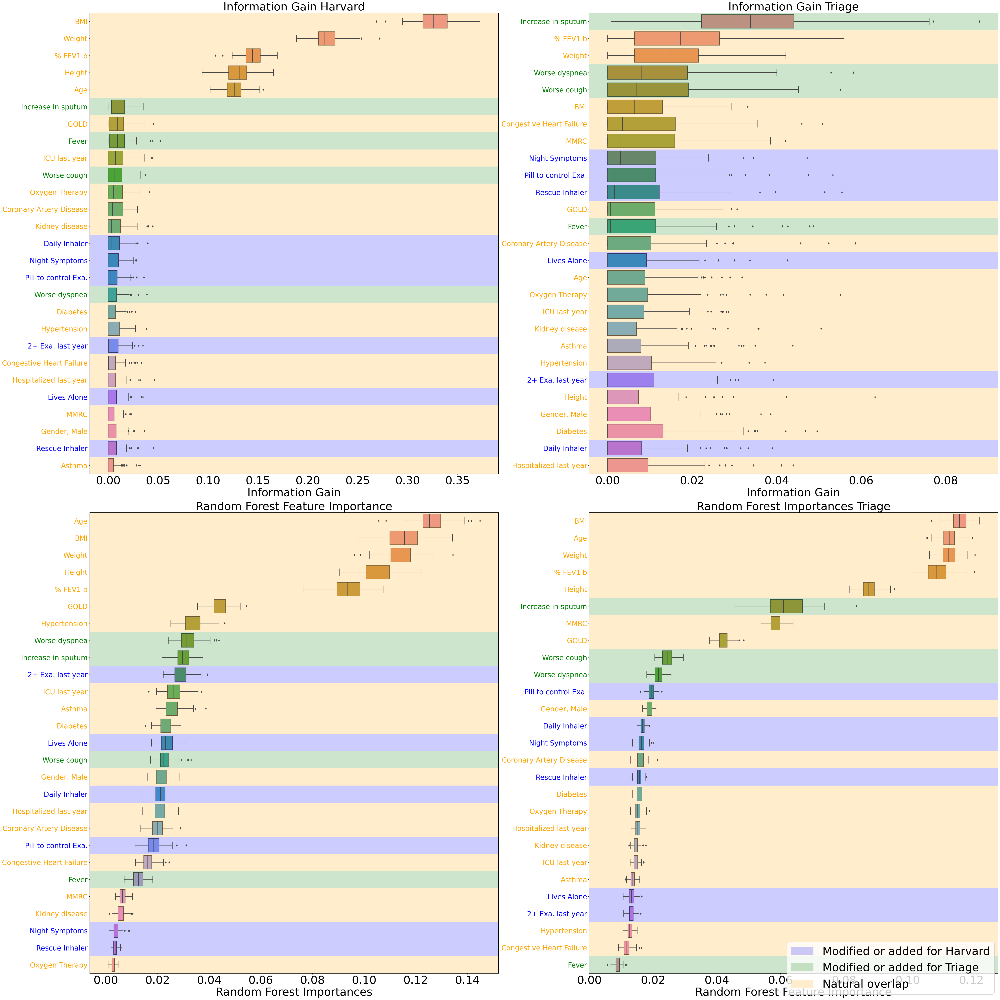

In [4]:
import matplotlib as mpl


modified_triage = ['Increase in sputum',  'Fever', 'Wheezing', 'Worse dyspnea', 'Worse cough']
modified_harvard = ['Night Symptoms', 'Rescue Inhaler', '2+ Exa. last year', 'Lives Alone', 'Daily Inhaler', 'Pill to control Exa.']
naturally_existing_in_both = [var for var in triage_copy if (var in harvard_copy.columns and var not in modified_triage and var not in modified_harvard)]
# append MMRC a, MMRC b and MMRC
naturally_existing_in_both.append('MMRC a')
naturally_existing_in_both.append('MMRC b')
naturally_existing_in_both.append('MMRC')
print(naturally_existing_in_both)

# prevent svg backend from rendering text as paths
new_rc_params = {'text.usetex': False,
"svg.fonttype": 'none'
}
mpl.rcParams.update(new_rc_params)

# create subplots with 4 large figures
fig, axs = plt.subplots(2, 2, figsize=(50, 50))
axs[0,0].set_title('Information Gain Harvard', fontsize=40)
axs[0,0].set_xlabel('Information Gain', fontsize=40)
axs[0,1].set_title('Information Gain Triage', fontsize=40)
axs[0,1].set_xlabel('Information Gain', fontsize=40)
axs[1,0].set_title('Random Forest Feature Importance', fontsize=40)
axs[1,0].set_xlabel('Random Forest Importances', fontsize=40)
axs[1,1].set_title('Random Forest Importances Triage', fontsize=40)
axs[1,1].set_xlabel('Random Forest Feature Importance', fontsize=40)

variables_count_difference = len(harvard_copy.columns) - len(triage_copy)
# add that many variables to the end of the triage dataframes
for i in range(variables_count_difference):
    mutual_info_split_triage_sorted["i "+"empty"] = np.nan
    rf_split_triage_sorted["i "+"empty"] = np.nan

# create a horzontal box plot of all features
sns.boxplot(data=mutual_info_split_harvard_sorted, orient='h', ax=axs[0,0])
sns.boxplot(data=mutual_info_split_triage_sorted, orient='h', ax=axs[0,1])
sns.boxplot(data=rf_split_harvard_sorted, orient='h', ax=axs[1,0])
sns.boxplot(data=rf_split_triage_sorted, orient='h', ax=axs[1,1])

# set the labels containg the word "empty to false"
for i in range(len(mutual_info_split_triage.columns)):
    # get the y_label at this position
    y_label = mutual_info_split_triage_sorted.columns[i]
    # if the label contains the word "empty"
    if "empty" in y_label:
        # set the label to false
        axs[0, 1].get_yticklabels()[i].set_visible(False)
        axs[1, 1].get_yticklabels()[i].set_visible(False)

# highlight all the variables that are also in the other dataset
for i in range(len(mutual_info_split_harvard.columns)):
    if mutual_info_split_harvard_sorted.columns[i] in naturally_existing_in_both:
        axs[0, 0].axhspan(i - 0.5, i + 0.5, facecolor='orange', alpha=0.2, label='Natural overlap')
        axs[0, 0].get_yticklabels()[i].set_color("orange")
    if mutual_info_split_harvard_sorted.columns[i] in modified_harvard:
        axs[0, 0].axhspan(i - 0.5, i + 0.5, facecolor='blue', alpha=0.2, label='Modified or added for Harvard')
        axs[0, 0].get_yticklabels()[i].set_color("blue")
    if mutual_info_split_harvard_sorted.columns[i] in modified_triage:
        axs[0, 0].axhspan(i - 0.5, i + 0.5, facecolor='green', alpha=0.2, label='Modified or added for Triage')
        axs[0, 0].get_yticklabels()[i].set_color("green")
    if rf_split_harvard_sorted.columns[i] in naturally_existing_in_both:
        axs[1, 0].axhspan(i - 0.5, i + 0.5, facecolor='orange', alpha=0.2, label='Natural overlaps')
        axs[1, 0].get_yticklabels()[i].set_color("orange")
    if rf_split_harvard_sorted.columns[i] in modified_harvard:
        axs[1, 0].axhspan(i - 0.5, i + 0.5, facecolor='blue', alpha=0.2, label='Modified or added for Harvard')
        axs[1, 0].get_yticklabels()[i].set_color("blue")
    if rf_split_harvard_sorted.columns[i] in modified_triage:
        axs[1, 0].axhspan(i - 0.5, i + 0.5, facecolor='green', alpha=0.2, label='Modified or added for Triage')
        axs[1, 0].get_yticklabels()[i].set_color("green")

for i in range(len(mutual_info_split_triage.columns)):
    if mutual_info_split_triage_sorted.columns[i] in naturally_existing_in_both:
        axs[0, 1].axhspan(i - 0.5, i + 0.5, facecolor='orange', alpha=0.2, label='Natural overlap')
        axs[0, 1].get_yticklabels()[i].set_color("orange")
    if mutual_info_split_triage_sorted.columns[i] in modified_harvard:
        axs[0, 1].axhspan(i - 0.5, i + 0.5, facecolor='blue', alpha=0.2, label='Modified or added for Harvard')
        axs[0, 1].get_yticklabels()[i].set_color("blue")
    if mutual_info_split_triage_sorted.columns[i] in modified_triage:
        axs[0, 1].axhspan(i - 0.5, i + 0.5, facecolor='green', alpha=0.2, label='Modified or added for Triage')
        axs[0, 1].get_yticklabels()[i].set_color("green")
    if rf_split_triage_sorted.columns[i] in naturally_existing_in_both:
        axs[1, 1].axhspan(i - 0.5, i + 0.5, facecolor='orange', alpha=0.2, label='Natural overlap')
        axs[1, 1].get_yticklabels()[i].set_color("orange")
    if rf_split_triage_sorted.columns[i] in modified_harvard:
        axs[1, 1].axhspan(i - 0.5, i + 0.5, facecolor='blue', alpha=0.2, label='Modified or added for Harvard')
        axs[1, 1].get_yticklabels()[i].set_color("blue")
    if rf_split_triage_sorted.columns[i] in modified_triage:
        axs[1, 1].axhspan(i - 0.5, i + 0.5, facecolor='green', alpha=0.2, label='Modified or added for Triage')
        axs[1, 1].get_yticklabels()[i].set_color("green")

# create one legend for the whole figure with labels 'Feature naturally existing in both datasets', 'Feature modified in or added to Harvard', 'Feature modified in or added to Triage'
desired_labels = ['Modified or added for Harvard', 'Modified or added for Triage', 'Natural overlap']
all_handles, all_labels = axs[0, 0].get_legend_handles_labels()

# Create dictionaries to store desired handles and labels
custom_handles_dict = {}
custom_labels_dict = {}

for handle, label in zip(all_handles, all_labels):
    if label in desired_labels:
        custom_handles_dict[label] = handle
        custom_labels_dict[label] = label

# Create a custom legend with only the desired labels and handles
custom_handles = [custom_handles_dict[label] for label in desired_labels]
custom_labels = [custom_labels_dict[label] for label in desired_labels]

# set font size of the x and y ticks
for ax in axs.flat:
    ax.tick_params(axis='x', labelsize=40)
    ax.tick_params(axis='y', labelsize=25)

# make sure legend is under the figures
fig.legend(custom_handles, custom_labels, loc='lower right', fontsize=40)
fig.tight_layout()
plt.savefig('all_feature_importances_2.svg', format='svg', dpi=1200, )
plt.show()

## Initial setup

In [4]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import StratifiedKFold, StratifiedShuffleSplit, GridSearchCV
from imblearn.over_sampling import SMOTE
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

X_harvard = df_harvard.copy().drop('Exacerbation', axis=1)
X_triage = df_triage.copy().drop('Exacerbation', axis=1)
y_harvard = df_harvard.copy()['Exacerbation']
y_triage = df_triage.copy()['Exacerbation']

relevant_features= ['% FEV1 b', 'MMRC', 'GOLD', '2+ Exa. last year', 'Incrase in sputum']
X_harvard = X_harvard[relevant_features]
X_triage = X_triage[relevant_features]

classifiers = [
    DecisionTreeClassifier(random_state=42, class_weight='balanced'),
    BalancedRandomForestClassifier(random_state=42, n_jobs=-1, class_weight='balanced_subsample'), 
    XGBClassifier(random_state=42, n_jobs=-1), 
    LogisticRegression(random_state=42, class_weight='balanced', n_jobs=-1, solver='liblinear'), 
    KNeighborsClassifier(n_jobs=-1),
    SVC(probability=True, class_weight='balanced'),
    GaussianNB(),
]

Fitting 5 folds for each of 72 candidates, totalling 360 fits
Results for DecisionTreeClassifier:
accuracy: 0.6486486486486487 precision: 0.2 recall: 0.45454545454545453 f1: 0.2777777777777778 roc_auc: 0.5685425685425686
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Results for DecisionTreeClassifier:
accuracy: 0.7702702702702703 precision: 0.2 recall: 0.18181818181818182 f1: 0.1904761904761905 roc_auc: 0.5274170274170275
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Results for DecisionTreeClassifier:
accuracy: 0.527027027027027 precision: 0.125 recall: 0.36363636363636365 f1: 0.18604651162790697 roc_auc: 0.45959595959595967
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Results for DecisionTreeClassifier:
accuracy: 0.6621621621621622 precision: 0.15 recall: 0.2727272727272727 f1: 0.19354838709677416 roc_auc: 0.5014430014430015
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Results for DecisionTreeClassifier:
accuracy: 0.70

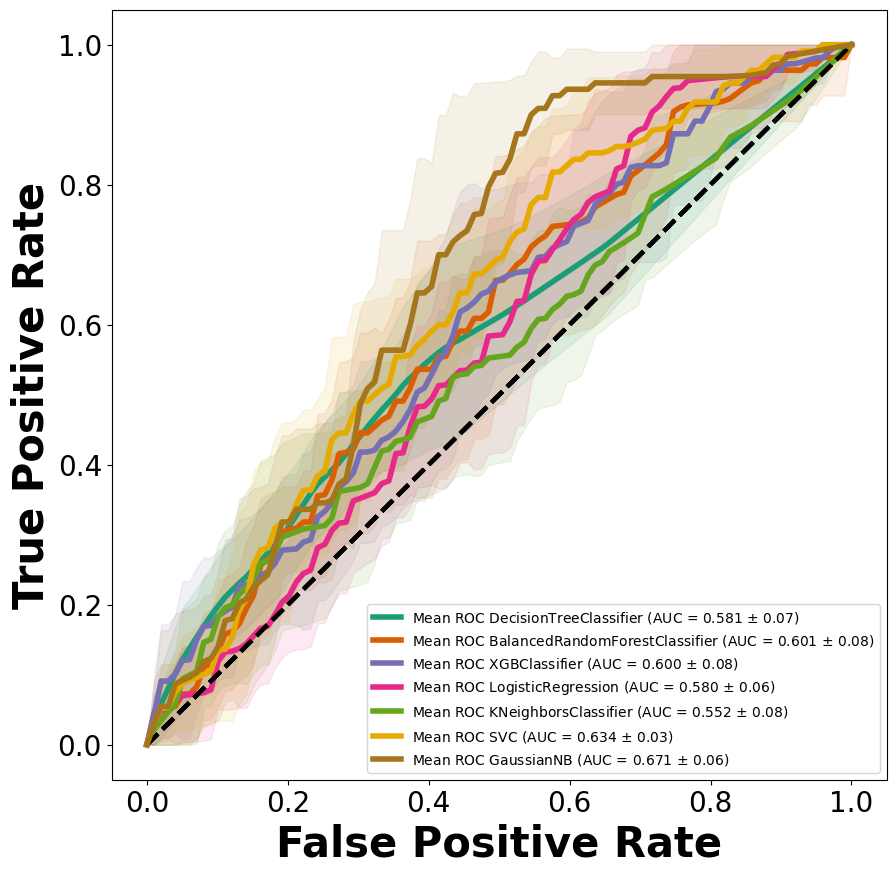

In [6]:
# ignore warnings
import warnings
warnings.filterwarnings('ignore')

model_evaluations = {
    'accuracy_scores': [],
    'precision_scores': [],
    'recall_scores': [],
    'f1_scores': [],
    'roc_auc_scores': [],
}

fig, ax = plt.subplots(figsize=(10, 10))
colors = plt.get_cmap("Dark2")
param_grids = [
    # DecisionTreeClassifier
    {
        "max_depth": [3, 5 , 10],
        "max_features": ["auto", "sqrt", "log2", None],
        "min_samples_leaf": [1,5,10],
        "criterion": ["gini", "entropy"],
    },
    # BalancedRandomForestClassifier
    {   
        'criterion':['gini','entropy'],
        'n_estimators':[10,20,30],
        'min_samples_leaf':[1,3,5],
        'min_samples_split':[3,5,7], 
        'max_features':['auto','sqrt','log2'],
        'max_depth':[2,3,5],
        'class_weight' : ["balanced", "balanced_subsample"]
    }, 
    # # XGBClassifier
    {
        'learning_rate':[0.01,0.03,0.05,0.1,0.15,0.2],
        'n_estimators':[10,20,30,40,100],
        'max_depth':[2,3,5],
        'colsample_bytree':[0.1,0.3,0.5,1],
        'subsample':[0.1,0.3,0.5,1],
    }, 
    # Logistic Regression
    {
        "penalty" : ["l2","l1"],
        "tol" : [0.0001,0.0002,0.0003],
        "max_iter": [100,200,300],
        "C" :[0.001,0.01, 0.1, 1, 10, 100],
        "intercept_scaling": [1, 2, 3, 4],
    },
    # # KNN
    {
        'n_neighbors':[5,6,7,8,9,10],
        'leaf_size':[1,2,3,5],
        'weights':['uniform', 'distance'],
        'algorithm':['auto', 'ball_tree','kd_tree','brute'],
    },
    # # SVM
    {
        'kernel': ['rbf','linear'], 
        'gamma': [0.0001, 0.001, 0.01, 0.1, 1,'auto'],
        'C': [1, 6, 7, 8, 9, 10, 11, 12, 10, 50, 100, 200, 300],
    },
    # Naive Bayes
    { },
]

classifier_cv_results = []
best_models = []
for j, classifier in enumerate(classifiers):
    name = str(classifier.__class__.__name__)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    roc_auc_scores = []
    grid_search_results = []
    sss = StratifiedShuffleSplit(n_splits=10, test_size=0.5, random_state=42)
    # prs = []
    # aucs = []
    # mean_recall = np.linspace(0, 1, 100)
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)
    for i, (train_index, test_index) in enumerate(sss.split(X_harvard, y_harvard)):
        X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = X_harvard.iloc[train_index], X_harvard.iloc[test_index], y_harvard.iloc[train_index], y_harvard.iloc[test_index]
        preprocessing = Pipeline(steps=[
            ['imputer', SimpleImputer(strategy='median')],
            ['scaler', StandardScaler()],
        ])
        # apply preprocessing to train and test set
        X_train_harvard = preprocessing.fit_transform(X_train_harvard)
        X_test_harvard = preprocessing.transform(X_test_harvard)
        # apply smote to train set
        smote = SMOTE(random_state=42)
        X_train_harvard, y_train_harvard = smote.fit_resample(X_train_harvard, y_train_harvard)
        kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
        param_grid = param_grids[j]
        grid_search = GridSearchCV(
            classifier,
            param_grid,
            scoring='roc_auc',
            # cv=kfold,
            return_train_score=True,
            verbose=1,
            n_jobs=-1,
        )
        grid_search.fit(X_train_harvard, y_train_harvard)
        cv_results = pd.DataFrame(grid_search.cv_results_)
        grid_search_results.append(cv_results)
        model = grid_search.best_estimator_
        model.fit(X_train_harvard, y_train_harvard)
        y_pred = model.predict(X_test_harvard)
        y_pred_proba = model.predict_proba(X_test_harvard)[:,1]
        
        # compute roc curve
        fpr, tpr, thresholds = roc_curve(y_test_harvard, y_pred_proba)
        tprs.append(np.interp(mean_fpr, fpr, tpr))
        tprs[-1][0] = 0.0
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc)

        # # Compute PR curve and area the curve
        # precision, recall, thresholds = precision_recall_curve(y_test_harvard, y_pred_proba)
        # interp_precision = np.interp(mean_recall, precision, recall)
        # # plt.plot(interp_precision, mean_recall, lw=1, alpha=0.8, color=colors(j))
        # prs.append(interp_precision)
        # pr_auc = auc(recall, precision)
        # aucs.append(pr_auc)
        accuracy_scores.append(accuracy_score(y_test_harvard, y_pred))
        precision_scores.append(precision_score(y_test_harvard, y_pred, ))
        recall_scores.append(recall_score(y_test_harvard, y_pred))
        f1_scores.append(f1_score(y_test_harvard, y_pred))
        roc_auc_scores.append(roc_auc_score(y_test_harvard, y_pred))

        print("Results for " + str(name) + ":")
        # print(grid_search.best_params_)
        # print(grid_search.best_score_)
        print("accuracy: "+str(accuracy_scores[-1]), "precision: "+str(precision_scores[-1]), "recall: "+str(recall_scores[-1]), "f1: "+str(f1_scores[-1]), "roc_auc: "+str(roc_auc_scores[-1]))
    
    classifier_cv_results.append(grid_search_results)
    
    model_evaluations['accuracy_scores'].append(accuracy_scores)
    model_evaluations['precision_scores'].append(precision_scores)
    model_evaluations['recall_scores'].append(recall_scores)
    model_evaluations['f1_scores'].append(f1_scores)
    model_evaluations['roc_auc_scores'].append(roc_auc_scores)
    
    plt.plot([0, 1], [0, 1], linestyle='--', lw=3, color='k',alpha=.8)
    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    plt.plot(mean_fpr, mean_tpr, color=colors(j),
             label=r'Mean ROC %s (AUC = %0.3f $\pm$ %0.2f)' % (name, mean_auc, std_auc),
             lw=4)


    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color=colors(j), alpha=.1,)
    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('False Positive Rate', fontweight = "bold" , fontsize=30)
    plt.ylabel('True Positive Rate',fontweight = "bold" , fontsize=30)
    plt.tick_params(axis='both', which='major', labelsize=20)
    plt.legend()


In [23]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold

classifiers = [RandomForestClassifier(random_state=42, n_jobs=-1),  KNeighborsClassifier(n_jobs=-1), XGBClassifier(random_state=42, n_jobs=-1), SVC(random_state=42), Perceptron(random_state=42, n_jobs=-1)]

mutual_info_results_harvard = dict().fromkeys([classifier.__class__.__name__ for classifier in classifiers])
mutual_info_results_harvard = {k: [] for k in mutual_info_results_harvard}
mutual_info_results_triage = dict().fromkeys([classifier.__class__.__name__ for classifier in classifiers])
mutual_info_results_triage = {k: [] for k in mutual_info_results_triage}
rf_results_harvard = dict().fromkeys([classifier.__class__.__name__ for classifier in classifiers])
rf_results_harvard = {k: [] for k in rf_results_harvard}
rf_results_triage = dict().fromkeys([classifier.__class__.__name__ for classifier in classifiers])
rf_results_triage = {k: [] for k in rf_results_triage}

stratified_kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
for classifier in classifiers:
    print(classifier.__class__.__name__)
    name = classifier.__class__.__name__
    # for 3 to len(X.columns) features test which amount of features is the best
    for i in range(3, len(X_harvard.columns)):
        # get the top i columns
        top_i_mi_features_harvard = mutual_info_split_harvard_sorted.iloc[:, :i].columns
        top_i_rf_features_harvard = rf_split_harvard_sorted.iloc[:, :i].columns
        X_slice_mi_harvard = X_harvard[top_i_mi_features_harvard].to_numpy()
        X_slice_rf_harvard = X_harvard[top_i_rf_features_harvard].to_numpy()
        # mutual info
        mutual_info_results_harvard[name].append(cross_val_score(classifier, X_slice_mi_harvard, y_harvard, cv=stratified_kfold, scoring='roc_auc', n_jobs=-1).mean())
        # random forest
        rf_results_harvard[name].append(cross_val_score(classifier, X_slice_rf_harvard, y_harvard, cv=stratified_kfold, scoring='roc_auc',  n_jobs=-1).mean())
    # for 3 to len(X.columns) features test which amount of features is the best
    for i in range(3, len(X_triage.columns)):
        # get the top i columns
        top_i_mi_features_triage = mutual_info_split_triage_sorted.iloc[:, :i].columns
        top_i_rf_features_triage = rf_split_triage_sorted.iloc[:, :i].columns
        X_slice_mi_triage = X_triage[top_i_mi_features_triage].to_numpy()
        X_slice_rf_triage = X_triage[top_i_rf_features_triage].to_numpy()
        # mutual info
        mutual_info_results_triage[name].append(cross_val_score(classifier, X_slice_mi_triage, y_triage, cv=stratified_kfold, scoring='roc_auc',  n_jobs=-1).mean())
        # random forest
        rf_results_triage[name].append(cross_val_score(classifier, X_slice_rf_triage, y_triage, cv=stratified_kfold, scoring='roc_auc',  n_jobs=-1).mean())

RandomForestClassifier
KNeighborsClassifier
XGBClassifier
SVC
Perceptron


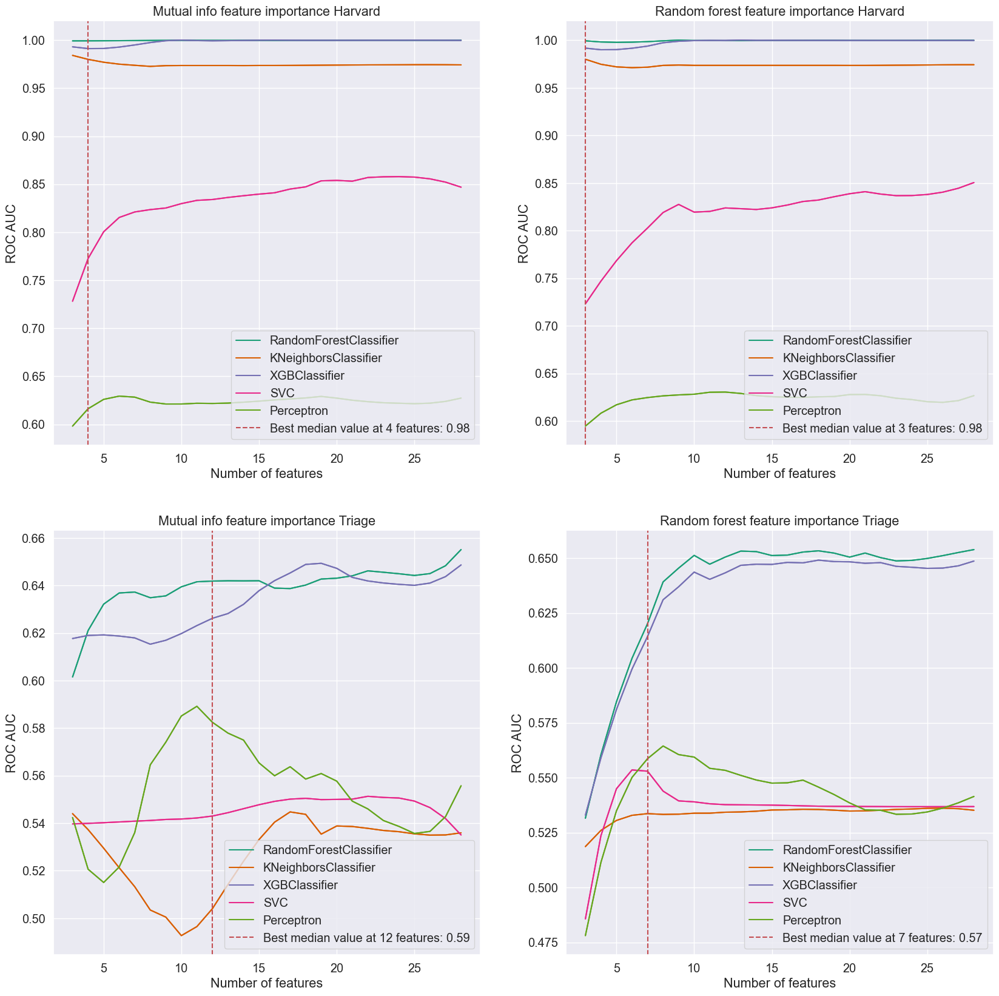

In [24]:
# performance over top features

from scipy.signal import savgol_filter

colors = plt.get_cmap("Dark2")
# create a 2x2 plot
fig, axes = plt.subplots(2, 2, figsize=(20, 20))
i = 0
for key, value in mutual_info_results_harvard.items():
    # smooth the curve
    axes[0, 0].plot(range(3, len(X_harvard.columns)), savgol_filter(value, 10, 3),  color = colors(i))
    # add a smooth curve through the points
    axes[0, 0].plot(range(3, len(X_harvard.columns)), savgol_filter(value, 10, 3), label=key, color = colors(i))
    i += 1
i = 0
for key, value in rf_results_harvard.items():
    axes[0, 1].plot(range(3, len(X_harvard.columns)), savgol_filter(value, 10, 3),  color = colors(i))
    # add a smooth curve through the points
    axes[0, 1].plot(range(3, len(X_harvard.columns)), savgol_filter(value, 10, 3), label=key, color = colors(i))
    i += 1
i = 0
for key, value in mutual_info_results_triage.items():
    axes[1, 0].plot(range(3, len(X_triage.columns)), savgol_filter(value, 10, 3),  color = colors(i))
    # add a smooth curve through the points
    axes[1, 0].plot(range(3, len(X_triage.columns)), savgol_filter(value, 10, 3), label=key, color = colors(i))
    i += 1
i = 0
for key, value in rf_results_triage.items():
    axes[1, 1].plot(range(3, len(X_triage.columns)), savgol_filter(value, 10, 3),  color = colors(i))
    # add a smooth curve through the points
    axes[1, 1].plot(range(3, len(X_triage.columns)), savgol_filter(value, 10, 3), label=key, color = colors(i))
    i += 1


# calculate the median of all 3 classifiers
median_mi_harvard = np.median([value for key, value in mutual_info_results_harvard.items()], axis=0)
median_mi_triage = np.median([value for key, value in mutual_info_results_triage.items()], axis=0)

# the value with the highest median is the best
best_mi_harvard = np.argmax(median_mi_harvard) + 3
best_mi_value_harvard = np.round(np.max(median_mi_harvard), 2)
best_mi_triage = np.argmax(median_mi_triage) + 3
best_mi_value_triage = np.round(np.max(median_mi_triage), 2)
median_rf_harvard = np.median([value for key, value in rf_results_harvard.items()], axis=0)
median_rf_triage = np.median([value for key, value in rf_results_triage.items()], axis=0)
best_rf_harvard = np.argmax(median_rf_harvard) + 3 
best_rf_value_harvard = np.round(np.max(median_rf_harvard), 2)
best_rf_triage = np.argmax(median_rf_triage) + 3
best_rf_value_triage = np.round(np.max(median_rf_triage), 2)

# add a vertical line at the best value
axes[0,0].axvline(best_mi_harvard, color='r', linestyle='--', label='Best median value at {} features: {}'.format(best_mi_harvard, best_mi_value_harvard))
axes[1,0].axvline(best_mi_triage, color='r', linestyle='--', label='Best median value at {} features: {}'.format(best_mi_triage, best_mi_value_triage))
axes[0,1].axvline(best_rf_harvard, color='r', linestyle='--', label='Best median value at {} features: {}'.format(best_rf_harvard, best_rf_value_harvard))
axes[1,1].axvline(best_rf_triage, color='r', linestyle='--', label='Best median value at {} features: {}'.format(best_rf_triage, best_rf_value_triage))

axes[0,0].set_title('Mutual info feature importance Harvard')
axes[0,0].set_xlabel('Number of features')
axes[0,0].set_ylabel('ROC AUC')
axes[0,1].set_title('Random forest feature importance Harvard')
axes[0,1].set_xlabel('Number of features')
axes[0,1].set_ylabel('ROC AUC')
axes[1,0].set_title('Mutual info feature importance Triage')
axes[1,0].set_xlabel('Number of features')
axes[1,0].set_ylabel('ROC AUC')
axes[1,1].set_title('Random forest feature importance Triage')
axes[1,1].set_xlabel('Number of features')
axes[1,1].set_ylabel('ROC AUC')


# add legend for every axes
for ax in axes.flat:
    ax.legend(loc='lower right')

# Best smallest common subset Triage

In [9]:
# perform rfe for Harvard
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# create a random forest classifier
rf = XGBClassifier(random_state=42, n_jobs=-1)
# create a recursive feature elimination object
rfecv = RFECV(estimator=rf, step=1, cv=StratifiedKFold(5), scoring='roc_auc', n_jobs=-1, min_features_to_select=1)
# fit the recursive feature elimination object to the data
X_harvard = df_harvard.drop('Exacerbation', axis=1).fillna(df_harvard.median())
y_harvard = df_harvard['Exacerbation']
rfecv.fit(X_harvard, y_harvard)
# plot the number of features vs the cross validation scores
print("Optimal number of features : %d" % rfecv.n_features_)
print('Best features :', X_harvard.columns[rfecv.support_])

rfecv = RFECV(estimator=rf, step=1, cv=StratifiedKFold(5), scoring='roc_auc', n_jobs=-1, min_features_to_select=1)
# fit the recursive feature elimination object to the data
X_triage = df_triage.drop('Exacerbation', axis=1).fillna(df_triage.median())
y_triage = df_triage['Exacerbation']
rfecv.fit(X_triage, y_triage)
# plot the number of features vs the cross validation scores
print("Optimal number of features : %d" % rfecv.n_features_)
print('Best features :', X_triage.columns[rfecv.support_])

Optimal number of features : 4
Best features : Index(['% FEV1 b', 'Age', 'Pill to control Exa.', 'Fever'], dtype='object')
Optimal number of features : 3
Best features : Index(['Increase in sputum', 'Worse cough', 'Worse dyspnea'], dtype='object')


                          Accuracy   Precision      Recall          F1  \
RandomForestClassifier  0.58(0.06)  0.09(0.04)  0.13(0.09)   0.1(0.06)   
KNeighborsClassifier     0.6(0.02)  0.21(0.04)  0.44(0.03)  0.29(0.04)   
LogisticRegression      0.57(0.07)  0.18(0.03)  0.44(0.13)  0.25(0.05)   
GaussianNB              0.66(0.05)  0.21(0.07)    0.4(0.1)  0.28(0.08)   
SVC                      0.4(0.06)  0.24(0.04)  0.88(0.09)  0.38(0.06)   

                               AUC  Brier Loss  
RandomForestClassifier  0.48(0.07)  0.24(0.02)  
KNeighborsClassifier    0.51(0.03)   0.3(0.02)  
LogisticRegression      0.58(0.05)  0.23(0.02)  
GaussianNB              0.52(0.06)  0.22(0.02)  
SVC                      0.6(0.07)  0.25(0.01)  
                        Accuracy  Precision   Recall        F1       AUC  \
RandomForestClassifier  0.627778   0.192982  0.34375  0.247191  0.563661   
KNeighborsClassifier    0.572222   0.207792  0.50000  0.293578  0.571791   
LogisticRegression      0.633333 

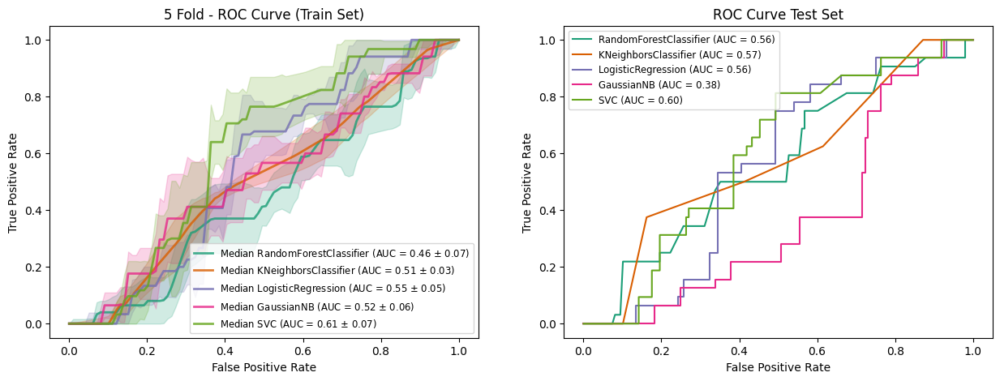

In [11]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss, roc_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

harvard_concat = df_harvard.sample(900, random_state=42, replace=True)
triage_concat = df_triage.sample(900, random_state=42, replace=True)

candidate_vars = ['% FEV1 b', 'Age', 'Height', 'Weight', 'BMI', 'MMRC', 'GOLD',
       'ICU last year', 'Rescue Inhaler', 'Night Symptoms', 'Exacerbation']
harvard_concat = harvard_concat[candidate_vars]
triage_concat = triage_concat[candidate_vars]

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(harvard_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'], test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(triage_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'], test_size=0.2, random_state=42)

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

best_models = [
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', RandomForestClassifier(random_state=42, n_jobs=-1))]),
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', KNeighborsClassifier(n_jobs=-1))]),
    # logistc regression
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', LogisticRegression(random_state=42, n_jobs=-1))]),
    # Naive Bayes
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', GaussianNB())]),
    # SVM
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', SVC(random_state=42, probability=True))]),
]
for i, model in enumerate(best_models):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_triage, y_train_triage)):
        model.fit(X_train_triage.iloc[train], y_train_triage.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_harvard.iloc[test],
            y_train_harvard.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_harvard.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_harvard.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_harvard.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_harvard.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_harvard.iloc[test], y_pred))
        y_pred_prob = model.predict_proba(X_train_harvard.iloc[test])
        auc_scores.append(roc_auc_score(y_train_harvard.iloc[test], y_pred_prob[:, 1]))
        brierscores.append(brier_score_loss(y_train_harvard.iloc[test], y_pred_prob[:, 1]))
    evaluation_train.loc[name] = [
        str(np.round(np.median(accuracy_scores), 2)) + "(" + str(np.round(np.std(accuracy_scores), 2)) +")",
        str(np.round(np.median(precision_scores), 2)) + "(" + str(np.round(np.std(precision_scores), 2)) +")",
        str(np.round(np.median(recall_scores), 2)) + "(" + str(np.round(np.std(recall_scores), 2)) +")",
        str(np.round(np.median(f1_scores), 2)) + "(" + str(np.round(np.std(f1_scores), 2)) +")",
        str(np.round(np.median(auc_scores), 2)) + "(" + str(np.round(np.std(auc_scores), 2)) +")",
        str(np.round(np.median(brierscores), 2)) + "(" + str(np.round(np.std(brierscores), 2)) +")",
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = auc(median_fpr, median_tpr)
    std_auc = np.std(aucs)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_harvard,
            y_test_harvard,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    # if name != "SVC":
    y_pred_proba = model.predict_proba(X_test_harvard)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test_harvard, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    evaluation_test.loc[name] = [
        accuracy_score(y_test_harvard, model.predict(X_test_harvard)),
        precision_score(y_test_harvard, model.predict(X_test_harvard)),
        recall_score(y_test_harvard, model.predict(X_test_harvard)),
        f1_score(y_test_harvard, model.predict(X_test_harvard)),
        roc_auc,
        brier_score_loss(y_test_harvard, y_pred_proba),
    ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

print(evaluation_train)
print(evaluation_test)

                        Accuracy  Precision  Recall   F1  AUC  Brier Loss
RandomForestClassifier      0.74       0.69    0.79 0.75 0.81        0.18
XGBClassifier               0.71       0.67    0.78 0.73 0.81        0.18
                        Accuracy  Precision  Recall   F1  AUC  Brier Loss
RandomForestClassifier      0.74       0.67    0.81 0.73 0.78        0.20
XGBClassifier               0.72       0.64    0.84 0.73 0.79        0.19


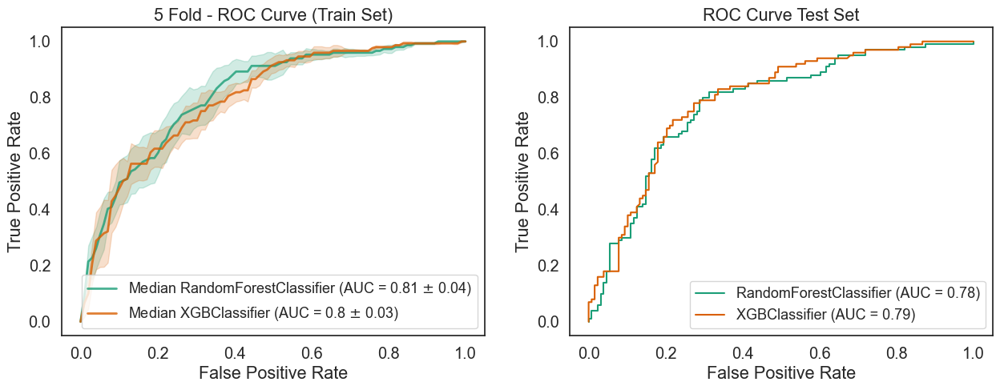

In [211]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")
for i, model in enumerate(best_models):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_triage, y_train_triage)):
        model.fit(X_train_triage.iloc[train], y_train_triage.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_triage.iloc[test],
            y_train_triage.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_triage.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_triage.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_triage.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_triage.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_triage.iloc[test], y_pred))
        y_pred_prob = model.predict_proba(X_train_triage.iloc[test])
        auc_scores.append(roc_auc_score(y_train_triage.iloc[test], y_pred_prob[:, 1]))
        brierscores.append(brier_score_loss(y_train_triage.iloc[test], y_pred_prob[:, 1]))
    evaluation_train.loc[name] = [
        np.median(accuracy_scores),
        np.median(precision_scores),
        np.median(recall_scores),
        np.median(f1_scores),
        np.median(auc_scores),
        np.median(brierscores),
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = auc(median_fpr, median_tpr)
    std_auc = np.std(aucs)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_triage,
            y_test_triage,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    y_pred_proba = model.predict_proba(X_test_triage)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test_triage, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    evaluation_test.loc[name] = [
        accuracy_score(y_test_triage, model.predict(X_test_triage)),
        precision_score(y_test_triage, model.predict(X_test_triage)),
        recall_score(y_test_triage, model.predict(X_test_triage)),
        f1_score(y_test_triage, model.predict(X_test_triage)),
        roc_auc,
        brier_score_loss(y_test_triage, y_pred_proba),
    ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

print(evaluation_train)
print(evaluation_test)

# Best common subset Harvard

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Daniel\AppData\L

                          Accuracy   Precision      Recall          F1  \
RandomForestClassifier  0.49(0.02)   0.4(0.22)  0.03(0.02)  0.05(0.03)   
KNeighborsClassifier    0.48(0.05)  0.56(0.13)  0.18(0.07)  0.27(0.09)   
LogisticRegression      0.52(0.02)  0.64(0.09)  0.12(0.05)   0.2(0.08)   
GaussianNB              0.53(0.03)  0.57(0.04)  0.32(0.05)   0.4(0.05)   
SVC                     0.48(0.02)    0.0(0.0)    0.0(0.0)    0.0(0.0)   

                               AUC  Brier Loss  
RandomForestClassifier  0.54(0.05)  0.35(0.02)  
KNeighborsClassifier     0.5(0.05)  0.49(0.04)  
LogisticRegression      0.55(0.04)  0.35(0.01)  
GaussianNB              0.53(0.02)  0.41(0.01)  
SVC                     0.49(0.03)  0.37(0.01)  
                        Accuracy  Precision    Recall        F1       AUC  \
RandomForestClassifier  0.488889   0.800000  0.042105  0.080000  0.475170   
KNeighborsClassifier    0.461111   0.461538  0.126316  0.198347  0.482105   
LogisticRegression      0.4777

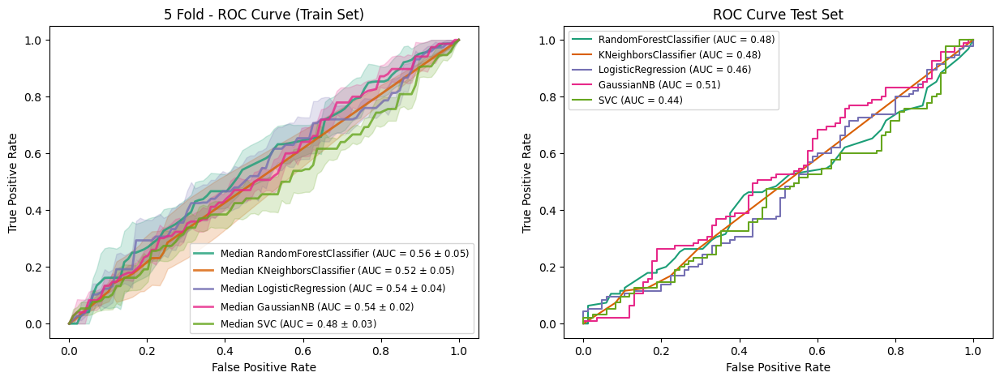

In [12]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss, roc_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

harvard_concat = df_harvard.sample(900, random_state=42, replace=True)
triage_concat = df_triage.sample(900, random_state=42, replace=True)

candidate_vars = ['% FEV1 b', 'Age', 'Height', 'Weight', 'BMI', 'MMRC', 'GOLD',
       'ICU last year', 'Rescue Inhaler', 'Night Symptoms', 'Exacerbation']
harvard_concat = harvard_concat[candidate_vars]
triage_concat = triage_concat[candidate_vars]

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(harvard_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'], test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(triage_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'], test_size=0.2, random_state=42)

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

best_models = [
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', RandomForestClassifier(random_state=42, n_jobs=-1))]),
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', KNeighborsClassifier(n_jobs=-1))]),
    # logistc regression
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', LogisticRegression(random_state=42, n_jobs=-1))]),
    # Naive Bayes
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', GaussianNB())]),
    # SVM
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', SVC(random_state=42, probability=True))]),
]
for i, model in enumerate(best_models):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_harvard, y_train_harvard)):
        model.fit(X_train_harvard.iloc[train], y_train_harvard.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_triage.iloc[test],
            y_train_triage.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_triage.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_triage.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_triage.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_triage.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_triage.iloc[test], y_pred))
        y_pred_prob = model.predict_proba(X_train_triage.iloc[test])
        auc_scores.append(roc_auc_score(y_train_triage.iloc[test], y_pred_prob[:, 1]))
        brierscores.append(brier_score_loss(y_train_triage.iloc[test], y_pred_prob[:, 1]))
    evaluation_train.loc[name] = [
        str(np.round(np.median(accuracy_scores), 2)) + "(" + str(np.round(np.std(accuracy_scores), 2)) +")",
        str(np.round(np.median(precision_scores), 2)) + "(" + str(np.round(np.std(precision_scores), 2)) +")",
        str(np.round(np.median(recall_scores), 2)) + "(" + str(np.round(np.std(recall_scores), 2)) +")",
        str(np.round(np.median(f1_scores), 2)) + "(" + str(np.round(np.std(f1_scores), 2)) +")",
        str(np.round(np.median(auc_scores), 2)) + "(" + str(np.round(np.std(auc_scores), 2)) +")",
        str(np.round(np.median(brierscores), 2)) + "(" + str(np.round(np.std(brierscores), 2)) +")",
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = auc(median_fpr, median_tpr)
    std_auc = np.std(aucs)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_triage,
            y_test_triage,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    y_pred_proba = model.predict_proba(X_test_triage)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test_triage, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    evaluation_test.loc[name] = [
        accuracy_score(y_test_triage, model.predict(X_test_triage)),
        precision_score(y_test_triage, model.predict(X_test_triage)),
        recall_score(y_test_triage, model.predict(X_test_triage)),
        f1_score(y_test_triage, model.predict(X_test_triage)),
        roc_auc,
        brier_score_loss(y_test_triage, y_pred_proba),
    ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

print(evaluation_train)
print(evaluation_test)

In [ ]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")
for i, model in enumerate(best_models):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_triage, y_train_triage)):
        model.fit(X_train_triage.iloc[train], y_train_triage.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_triage.iloc[test],
            y_train_triage.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_triage.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_triage.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_triage.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_triage.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_triage.iloc[test], y_pred))
        if name != "SVC":
            y_pred_prob = model.predict_proba(X_train_triage.iloc[test])
            auc_scores.append(roc_auc_score(y_train_triage.iloc[test], y_pred_prob[:, 1]))
            brierscores.append(brier_score_loss(y_train_triage.iloc[test], y_pred_prob[:, 1]))
    evaluation_train.loc[name] = [
        np.median(accuracy_scores),
        np.median(precision_scores),
        np.median(recall_scores),
        np.median(f1_scores),
        np.median(auc_scores),
        np.median(brierscores),
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = auc(median_fpr, median_tpr)
    std_auc = np.std(aucs)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_triage,
            y_test_triage,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    if name != "SVC":
        y_pred_proba = model.predict_proba(X_test_triage)[:,1]
        fpr, tpr, thresholds = roc_curve(y_test_triage, y_pred_proba)
        roc_auc = auc(fpr, tpr)
        evaluation_test.loc[name] = [
            accuracy_score(y_test_triage, model.predict(X_test_triage)),
            precision_score(y_test_triage, model.predict(X_test_triage)),
            recall_score(y_test_triage, model.predict(X_test_triage)),
            f1_score(y_test_triage, model.predict(X_test_triage)),
            roc_auc,
            brier_score_loss(y_test_triage, y_pred_proba),
        ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

print(evaluation_train)
print(evaluation_test)

# Blended learning

Number of harvard train samples: 117
Number of harvard test samples: 30
Number of triage train samples: 908
Number of triage test samples: 228
Blend percentage: 0.1
Number to add: 91.0
Percentage harvard: 0.78
Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                ('scaler', StandardScaler()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.05,
                               max_bin=None, max_cat_threshold=None,
         

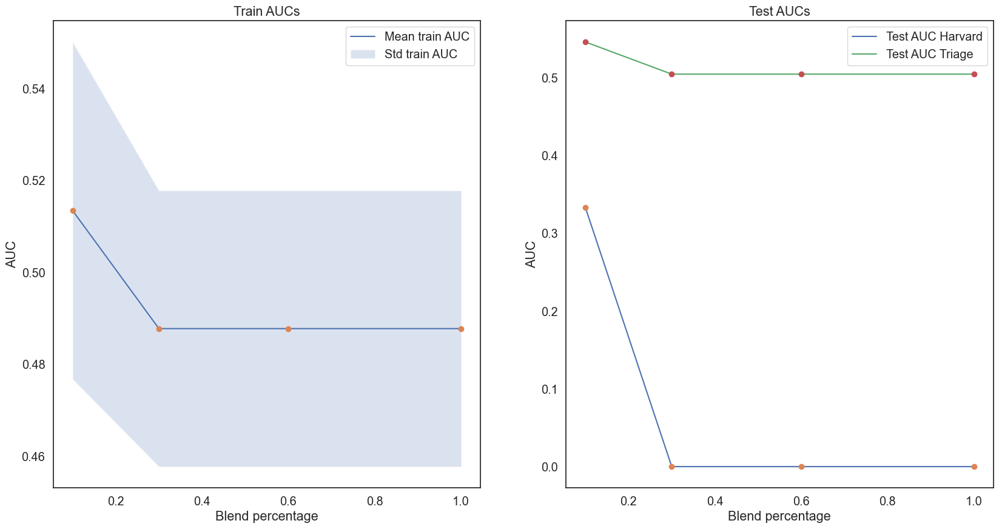

In [29]:
from sklearn import metrics
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import SelectKBest, mutual_info_classif, f_classif
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier

target = 'Exacerbation'

stratified_k_fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

harvard_copy = df_harvard.copy()
triage_copy = df_triage.copy()

candidate_vars = ['% FEV1 b', 'Age', 'Height', 'Weight', 'BMI', 'MMRC', 'GOLD', 'Exacerbation']

harvard_copy = harvard_copy[candidate_vars]
triage_copy = triage_copy[candidate_vars]

X_harvard = harvard_copy.drop(target, axis=1)
y_harvard = harvard_copy[target]

X_triage = triage_copy.drop(target, axis=1)
y_triage = triage_copy[target]

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(X_harvard, y_harvard, test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(X_triage, y_triage, test_size=0.2, random_state=42)

print("Number of harvard train samples: {}".format(len(X_train_harvard)))
print("Number of harvard test samples: {}".format(len(X_test_harvard)))
print("Number of triage train samples: {}".format(len(X_train_triage)))
print("Number of triage test samples: {}".format(len(X_test_triage)))

model = Pipeline([('imputer', SimpleImputer(strategy='median')),('scaler', StandardScaler()), ('classifier', XGBClassifier(random_state=42, n_jobs=-1))])

param_grid = {
    'classifier__n_estimators': [100, 200, 300, 400, 500],
    'classifier__max_depth' : [3,5,9,12],
    'classifier__learning_rate' : [0.01, 0.05, 0.1, 0.2, 0.3],
}


blend_percentages = [0.1, 0.3,  0.6, 1]


# Train on triage, blend harvard into it and test on harvard

blend_absolute = []
train_mean_f1s = []
train_std_f1s = []
test_harvard_f1s = []
test_triage_f1s = []
for blend_percentage in blend_percentages:
    print("Blend percentage: {}".format(blend_percentage))
    num_to_add = np.round(blend_percentage * len(X_train_triage))
    print("Number to add: {}".format(num_to_add))
    blend_absolute.append(num_to_add)
    percentage_harvard = np.round(num_to_add / len(X_train_harvard), 2)
    print("Percentage harvard: {}".format(percentage_harvard))
    test_size = 1 - percentage_harvard
    if test_size > 0:
        # split harvard into blending and test set
        X_train_blend_harvard,_  = train_test_split(X_train_harvard, test_size=1-percentage_harvard)
    else:
        X_train_blend_harvard = X_train_harvard
    corresponding_labels = y_train_harvard.loc[X_train_blend_harvard.index]

    train_aucs = []
    test_aucs = []
    blended_X = pd.concat([X_train_triage, X_train_blend_harvard])
    blended_y = pd.concat([y_train_triage, corresponding_labels])
    gridSearch = GridSearchCV(model, param_grid, cv=stratified_k_fold, scoring='f1', n_jobs=-1, return_train_score=True)
    gridSearch.fit(blended_X, blended_y)
    # get mean test score and std
    train_mean_f1s.append(np.mean(gridSearch.cv_results_['mean_test_score']))
    train_std_f1s.append(np.mean(gridSearch.cv_results_['std_test_score']))
    # apply best model on test set
    best_model = gridSearch.best_estimator_
    print(best_model)
    y_pred_harvard = best_model.predict(X_test_harvard)
    y_pred_triage = best_model.predict(X_test_triage)
    # calculate f1 for harvard
    f1 = metrics.f1_score(y_test_harvard, y_pred_harvard)
    test_harvard_f1s.append(f1)
    # calculate AUC for triage
    f1 = metrics.f1_score(y_test_triage, y_pred_triage)
    test_triage_f1s.append(f1)

# create a 1x2 figure with train and test scores for each blend percentage
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].set_title('Train AUCs')
axs[0].set_xlabel('Blend percentage')
axs[0].set_ylabel('AUC')
axs[1].set_title('Test AUCs')
axs[1].set_xlabel('Blend percentage')
axs[1].set_ylabel('AUC')
# plot the mean train auc and std
axs[0].plot(blend_percentages, train_mean_f1s, label='Mean train AUC')
axs[0].plot(blend_percentages, train_mean_f1s, 'o')
min_std = np.subtract(train_mean_f1s, train_std_f1s)
max_std = np.add(train_mean_f1s, train_std_f1s)
axs[0].fill_between(blend_percentages, min_std, max_std, alpha=0.2, label='Std train AUC')
# plot the test auc
axs[1].plot(blend_percentages, test_harvard_f1s, label='Test AUC Harvard')
axs[1].plot(blend_percentages, test_harvard_f1s, 'o')
axs[1].plot(blend_percentages, test_triage_f1s, label='Test AUC Triage')
axs[1].plot(blend_percentages, test_triage_f1s, 'o')
# add a legend
axs[0].legend()
axs[1].legend()



Blend percentage: 0.1
Number to add: 12.0
Percentage triage: 0.01
Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                ('scaler', StandardScaler()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.05,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=3, max_leaves=None,
                

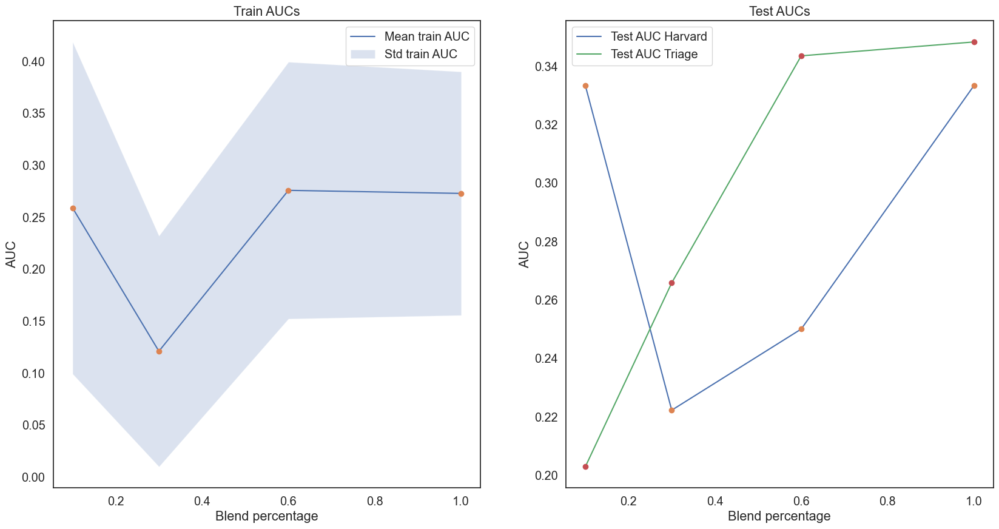

In [30]:
from sklearn import metrics
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import SelectKBest, mutual_info_classif, f_classif
from xgboost import XGBClassifier

target = 'Exacerbation'

stratified_k_fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

candidate_vars = ['% FEV1 b', 'Age', 'Height', 'Weight', 'BMI', 'MMRC', 'GOLD', 'Exacerbation']

harvard_copy = df_harvard.copy()
triage_copy = df_triage.copy()

harvard_copy = harvard_copy[candidate_vars]
triage_copy = triage_copy[candidate_vars]

X_harvard = harvard_copy.drop(target, axis=1)
y_harvard = harvard_copy[target]

X_triage = triage_copy.drop(target, axis=1)
y_triage = triage_copy[target]

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(X_harvard, y_harvard, test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(X_triage, y_triage, test_size=0.2, random_state=42)

model = Pipeline([('imputer', SimpleImputer(strategy='median')), ('scaler', StandardScaler()), ('classifier', XGBClassifier(random_state=42))])

param_grid = {
    'classifier__n_estimators': [100, 200, 300, 400, 500],
    'classifier__max_depth' : [3,5,9,12],
    'classifier__learning_rate' : [0.01, 0.05, 0.1, 0.2, 0.3],
}


blend_percentages = [0.1, 0.3,  0.6, 1]


# Train on triage, blend harvard into it and test on harvard

blend_absolute = []
train_mean_f1s = []
train_std_f1s = []
test_harvard_f1s = []
test_triage_f1s = []
for blend_percentage in blend_percentages:
    print("Blend percentage: {}".format(blend_percentage))
    num_to_add = np.round(blend_percentage * len(X_train_harvard))
    print("Number to add: {}".format(num_to_add))
    blend_absolute.append(num_to_add)
    percentage_triage = np.round(num_to_add / len(X_train_triage), 2)
    print("Percentage triage: {}".format(percentage_triage))
    test_size = 1 - percentage_triage
    if test_size > 0:
        # split harvard into blending and test set
        X_train_blend_triage,_  = train_test_split(X_train_triage, test_size=1-percentage_triage)
    else:
        X_train_blend_triage = X_train_triage
    corresponding_labels = y_train_triage.loc[X_train_blend_triage.index]

    train_aucs = []
    test_aucs = []
    blended_X = pd.concat([X_train_harvard, X_train_blend_triage])
    blended_y = pd.concat([y_train_harvard, corresponding_labels])
    gridSearch = GridSearchCV(model, param_grid, cv=stratified_k_fold, scoring='f1', n_jobs=-1, return_train_score=True)
    gridSearch.fit(blended_X, blended_y)
    # get mean test score and std
    train_mean_f1s.append(np.mean(gridSearch.cv_results_['mean_test_score']))
    train_std_f1s.append(np.mean(gridSearch.cv_results_['std_test_score']))
    # apply best model on test set
    best_model = gridSearch.best_estimator_
    print(best_model)
    y_pred_harvard = best_model.predict(X_test_harvard)
    y_pred_triage = best_model.predict(X_test_triage)
    # calculate f1 for harvard
    f1 = metrics.f1_score(y_test_harvard, y_pred_harvard)
    test_harvard_f1s.append(f1)
    # calculate AUC for triage
    f1 = metrics.f1_score(y_test_triage, y_pred_triage)
    test_triage_f1s.append(f1)

# create a 1x2 figure with train and test scores for each blend percentage
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].set_title('Train AUCs')
axs[0].set_xlabel('Blend percentage')
axs[0].set_ylabel('AUC')
axs[1].set_title('Test AUCs')
axs[1].set_xlabel('Blend percentage')
axs[1].set_ylabel('AUC')
# plot the mean train auc and std
axs[0].plot(blend_percentages, train_mean_f1s, label='Mean train AUC')
axs[0].plot(blend_percentages, train_mean_f1s, 'o')
min_std = np.subtract(train_mean_f1s, train_std_f1s)
max_std = np.add(train_mean_f1s, train_std_f1s)
axs[0].fill_between(blend_percentages, min_std, max_std, alpha=0.2, label='Std train AUC')
# plot the test auc
axs[1].plot(blend_percentages, test_harvard_f1s, label='Test AUC Harvard')
axs[1].plot(blend_percentages, test_harvard_f1s, 'o')
axs[1].plot(blend_percentages, test_triage_f1s, label='Test AUC Triage')
axs[1].plot(blend_percentages, test_triage_f1s, 'o')
# add a legend
axs[0].legend()
axs[1].legend()



# Matching

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\psmpy\psmpy.py:363: UserWarning:

Some values do not have a match. These are dropped for purposes of establishing a matched dataframe, and subsequent calculations and plots (effect size). If you do not wish this to be the case please set drop_unmatched=False



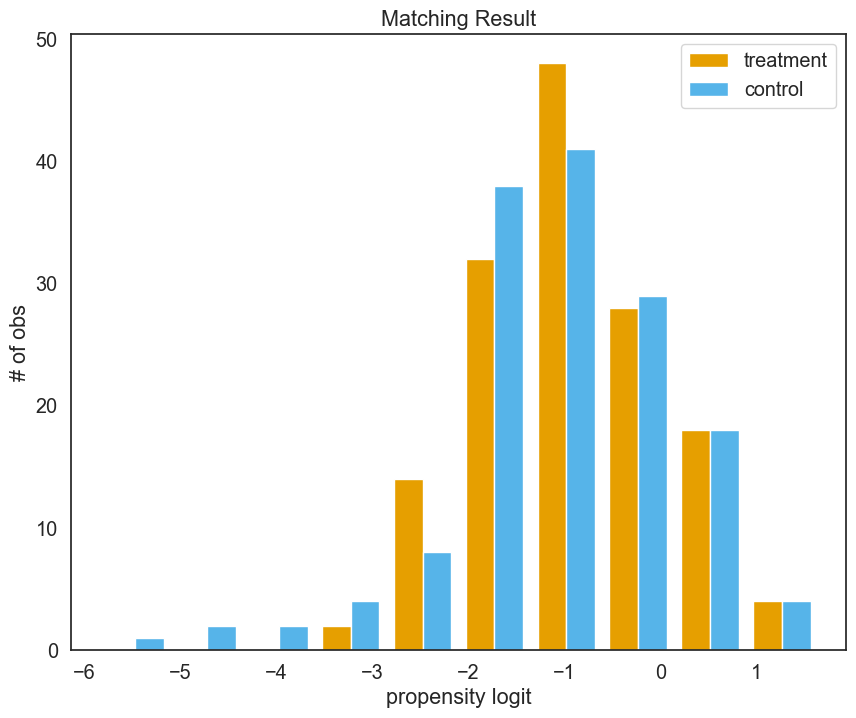

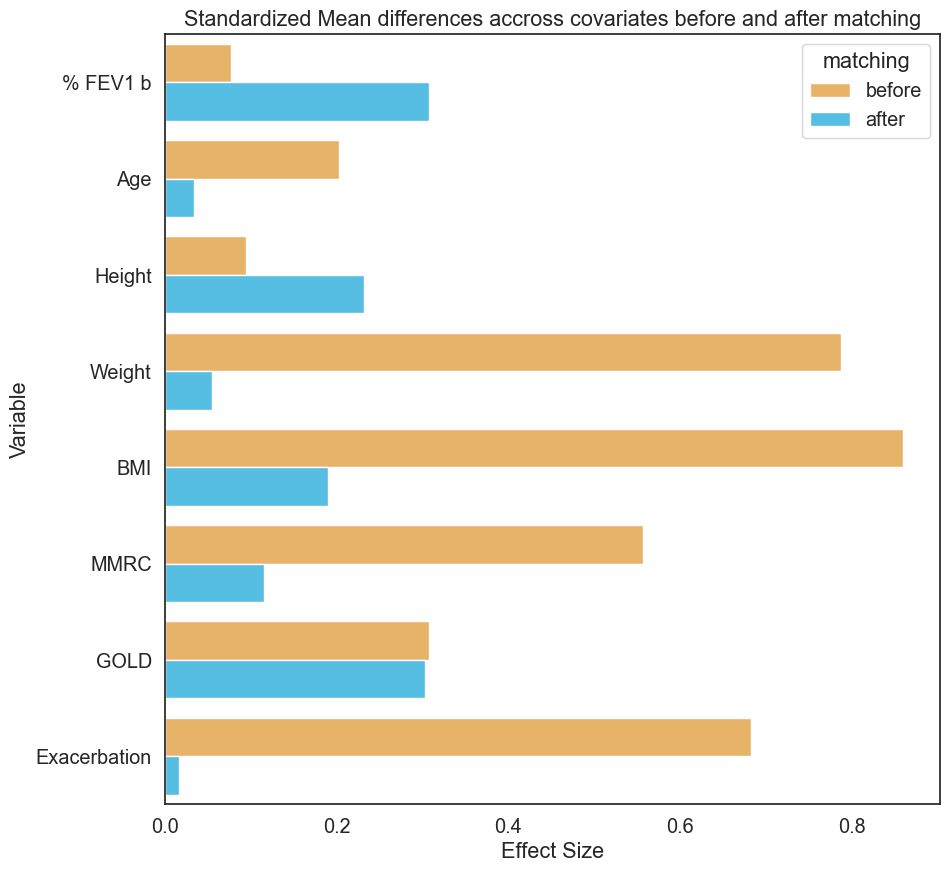

In [41]:
from psmpy import PsmPy
from psmpy.functions import cohenD
from psmpy.plotting import *

triage_copy = df_triage.copy()
harvard_copy = df_harvard.copy()

# triage_copy.fillna(triage_copy.median(), inplace=True)
# harvard_copy.fillna(harvard_copy.median(), inplace=True)

# apply KNN imputer
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
triage_copy = pd.DataFrame(imputer.fit_transform(triage_copy), columns=triage_copy.columns)
harvard_copy = pd.DataFrame(imputer.fit_transform(harvard_copy), columns=harvard_copy.columns)

# apply iterative imputer
# from sklearn.experimental import enable_iterative_imputer
# from sklearn.impute import IterativeImputer
# imp = IterativeImputer(max_iter=10, random_state=0)
# triage_copy = pd.DataFrame(imp.fit_transform(triage_copy), columns=triage_copy.columns)
# bin the mmrc into the respective bins from before (1, 2, 3, 4, 5)
triage_copy['MMRC'] = triage_copy['MMRC'].apply(lambda x: 1 if x <= 1 else 2 if x <= 2 else 3 if x <= 3 else 4 if x <= 4 else 5)
# harvard_copy = pd.DataFrame(imp.fit_transform(harvard_copy), columns=harvard_copy.columns)
# bin the mmrc into the respective bins from before (1, 2, 3, 4, 5)
harvard_copy['MMRC'] = harvard_copy['MMRC'].apply(lambda x: 1 if x <= 1 else 2 if x <= 2 else 3 if x <= 3 else 4 if x <= 4 else 5)

candidate_vars = ['% FEV1 b', 'Age', 'Height', 'Weight', 'BMI', 'MMRC', 'GOLD', 'Exacerbation']
triage_copy = triage_copy[candidate_vars]
harvard_copy = harvard_copy[candidate_vars]

# shared_columns = triage_copy.columns.intersection(harvard_copy.columns)
# triage_exa = triage_copy[triage_copy['Exacerbation'] == 1]
# triage_no_exa = triage_copy[triage_copy['Exacerbation'] == 0]
# harvard_exa = harvard_copy[harvard_copy['Exacerbation'] == 1]
# harvard_no_exa = harvard_copy[harvard_copy['Exacerbation'] == 0]

# perform psm match for the entire distribution
triage_copy['triage'] = 1
harvard_copy['triage'] = 0
total = pd.concat([triage_copy, harvard_copy])
# reset index
total.reset_index(drop=True, inplace=True)
# add index column
total['index'] = total.index
psm_total = PsmPy(total, treatment='triage', indx='index', target='Exacerbation') #exclude = ['Exacerbation'])
psm_total.logistic_ps(balance = True)
psm_total.knn_matched(matcher='propensity_logit', replacement=False, caliper=None, drop_unmatched=True)
psm_total.plot_match(Title='Matching Result', Ylabel='# of obs', Xlabel= 'propensity logit', names = ['treatment', 'control'])
# display(psm_total.effect_size)
fig, ax = plt.subplots(figsize=(10, 10))
psm_total.effect_size_plot()

# # export dataframe
# total_cohort = psm_total.df_matched
# total_cohort.to_csv('total_cohort.csv', sep=";", decimal=",", index=False)

# # perform psm match for exa and no_exa separately
# triage_exa['triage'] = 1
# triage_no_exa['triage'] = 1
# harvard_exa['triage'] = 0
# harvard_no_exa['triage'] = 0

# exa = pd.concat([triage_exa, harvard_exa])
# exa = exa.sample(frac=1)
# # reset index
# exa.reset_index(drop=True, inplace=True)
# exa['index'] = exa.index
# no_exa = pd.concat([triage_no_exa, harvard_no_exa])
# no_exa = no_exa.sample(frac=1)
# # reset index
# no_exa.reset_index(drop=True, inplace=True)
# no_exa['index'] = no_exa.index

# psm_exa = PsmPy(exa, treatment='triage', indx='index', exclude = [], target='Exacerbation')
# psm_exa.logistic_ps(balance = False)
# psm_exa.knn_matched(matcher='propensity_score', replacement=False, caliper=None, drop_unmatched=True)
# # psm_exa.knn_matched_12n(matcher='propensity_score', how_many=1)

# psm_no_exa = PsmPy(no_exa, treatment='triage', indx='index', exclude = [], target='Exacerbation')
# psm_no_exa.logistic_ps(balance = False)
# psm_no_exa.knn_matched(matcher='propensity_score', replacement=False, caliper=None, drop_unmatched=True)
# # psm_no_exa.knn_matched_12n(matcher='propensity_score', how_many=1)


# print(exa.shape, no_exa.shape)
# print(psm_exa.df_matched.shape, psm_no_exa.df_matched.shape)

[0.0, 9.0, 15.0, 17.0, 27.0, 52.0, 53.0, 55.0, 65.0, 92.0, 100.0, 120.0, 123.0, 128.0, 135.0, 136.0, 149.0, 152.0, 161.0, 183.0, 199.0, 211.0, 225.0, 226.0, 238.0, 270.0, 272.0, 273.0, 275.0, 278.0, 279.0, 287.0, 292.0, 294.0, 301.0, 305.0, 325.0, 326.0, 328.0, 334.0, 339.0, 342.0, 372.0, 376.0, 382.0, 386.0, 391.0, 396.0, 398.0, 416.0, 422.0, 431.0, 432.0, 433.0, 437.0, 458.0, 460.0, 465.0, 480.0, 492.0, 498.0, 505.0, 513.0, 520.0, 525.0, 526.0, 527.0, 528.0, 539.0, 546.0, 550.0, 555.0, 561.0, 567.0, 570.0, 578.0, 583.0, 588.0, 590.0, 595.0, 601.0, 607.0, 611.0, 613.0, 617.0, 625.0, 632.0, 638.0, 644.0, 658.0, 661.0, 668.0, 678.0, 683.0, 685.0, 696.0, 699.0, 704.0, 709.0, 722.0, 726.0, 727.0, 735.0, 750.0, 754.0, 758.0, 780.0, 791.0, 796.0, 797.0, 799.0, 813.0, 820.0, 824.0, 827.0, 828.0, 835.0, 839.0, 862.0, 867.0, 886.0, 888.0, 894.0, 898.0, 920.0, 921.0, 927.0, 937.0, 945.0, 951.0, 958.0, 971.0, 984.0, 988.0, 992.0, 993.0, 1008.0, 1017.0, 1035.0, 1038.0, 1041.0, 1045.0, 1056.0, 105

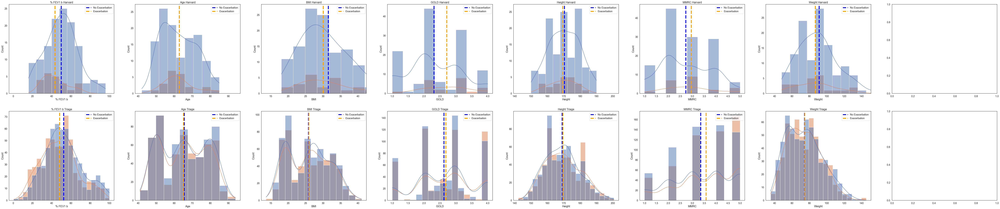

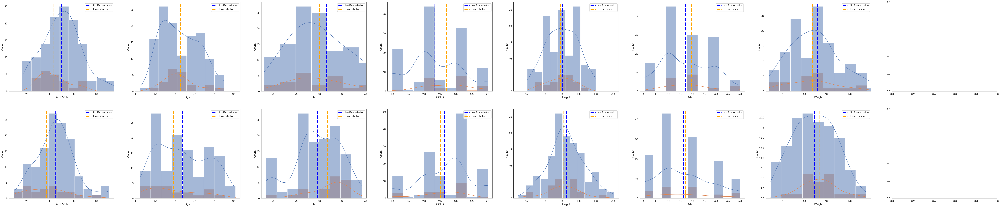

In [44]:
# for case of total propensity score matching
from pandasgui import show

# drop any row that has a NaN value in matched_ID and whose index is not in the matched_ID column
df_matches_copy = psm_total.df_matched.copy()
df_matches_copy.dropna(subset=['matched_ID'], inplace=True)
print(sorted(df_matches_copy['matched_ID'].unique()))
# add all rows to df_matches that are in the matched_ID column
df_matches_copy = pd.concat([df_matches_copy, psm_total.df_matched[psm_total.df_matched['index'].isin(df_matches_copy['matched_ID'])]])
df_matches_copy = df_matches_copy[['% FEV1 b', 'Age', 'Height', 'Weight', 'BMI', 'MMRC', 'GOLD', 'triage', 'Exacerbation']]
triage_concat = df_matches_copy[df_matches_copy['triage'] == 1]
print(len(triage_concat))
harvard_concat = df_matches_copy[df_matches_copy['triage'] == 0]
print(len(harvard_concat))

# in the case of propensity score matching for exa and no_exa separately
# no_exa_matches_copy = psm_no_exa.df_matched.copy()
# no_exa_matches_copy.dropna(subset=['matched_ID'], inplace=True)
# # add all rows to df_matches that are in the matched_ID column
# no_exa_matches_copy = pd.concat([no_exa_matches_copy, psm_no_exa.df_matched[psm_no_exa.df_matched['index'].isin(no_exa_matches_copy['matched_ID'])]])
# no_exa_matches_copy = no_exa_matches_copy[['BMI', 'Age', 'MMRC', '% FEV1 b', 'Exacerbation', 'triage']]
# no_exa_triage = no_exa_matches_copy[no_exa_matches_copy['triage'] == 1]
# no_exa_harvard = no_exa_matches_copy[no_exa_matches_copy['triage'] == 0]

# exa_matches_copy = psm_exa.df_matched.copy()
# exa_matches_copy.dropna(subset=['matched_ID'], inplace=True)
# # add all rows to df_matches that are in the matched_ID column
# exa_matches_copy = pd.concat([exa_matches_copy, psm_exa.df_matched[psm_exa.df_matched['index'].isin(exa_matches_copy['matched_ID'])]])
# exa_matches_copy = exa_matches_copy[['BMI', 'Age', 'MMRC', '% FEV1 b', 'Exacerbation', 'triage']]
# exa_triage = exa_matches_copy[exa_matches_copy['triage'] == 1]
# exa_harvard = exa_matches_copy[exa_matches_copy['triage'] == 0]

# # if index is not in the original dataset, it is not in the matched dataset
# psm_exa_indices = psm_exa.df_matched.index
# # remove all indices that are not in the original dataset
# psm_exa_indices = psm_exa_indices[psm_exa_indices.isin(exa.index)]
# exa = exa.loc[psm_exa_indices]
# exa_triage = exa[exa['triage'] == 1]
# exa_harvard = exa[exa['triage'] == 0]

# psm_no_exa_indices = psm_no_exa.df_matched.index
# psm_no_exa_indices = psm_no_exa_indices[psm_no_exa_indices.isin(no_exa.index)]
# no_exa = no_exa.loc[psm_no_exa_indices]
# no_exa_triage = no_exa[no_exa['triage'] == 1]
# no_exa_harvard = no_exa[no_exa['triage'] == 0]

# triage_concat = pd.concat([exa_triage, no_exa_triage]).drop(columns=['triage'])
# harvard_concat = pd.concat([exa_harvard, no_exa_harvard]).drop(columns=['triage'])

# drop all rows with NaN values
# psm_total.df_matched.dropna(inplace=True)
# only take the values with the first


# plot histograms of datasets before matching
fig, axs = plt.subplots(2, 8, figsize=(100, 20))
# plot the histogram of each variable
row, col = 0, 0
for var in sorted(candidate_vars):
    if var == 'Exacerbation':
        continue
    # create 
    subset_harvard = harvard_copy[[var, 'Exacerbation']]
    # add a row called label
    sns.histplot(subset_harvard, x=var, hue='Exacerbation', ax=axs[0, col], kde=True)
    # add a bar for the mean of each group
    axs[0, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 0][var].mean(), color='blue', linestyle='dashed', linewidth=5, label='No Exacerbation')
    axs[0, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 1][var].mean(), color='orange', linestyle='dashed', linewidth=5, label='Exacerbation')
    # set title
    axs[0, col].set_title(var + " Harvard")
    # add legend
    axs[0, col].legend(loc='upper right')
    subset_triage = triage_copy[[var, 'Exacerbation']]
    # add a row called label
    sns.histplot(subset_triage, x=var, hue='Exacerbation', ax=axs[1, col], kde=True)
    # add a bar for the mean of each group
    axs[1, col].axvline(subset_triage[subset_triage['Exacerbation'] == 0][var].mean(), color='blue', linestyle='dashed', linewidth=5, label='No Exacerbation')
    axs[1, col].axvline(subset_triage[subset_triage['Exacerbation'] == 1][var].mean(), color='orange', linestyle='dashed', linewidth=5, label='Exacerbation')
    # set title
    axs[1, col].set_title(var + " Triage")
    # add legend
    axs[1, col].legend(loc='upper right')
    # enforce same x axis
    axs[0, col].set_xlim(axs[1, col].get_xlim())

    # move to the next column
    col += 1


# plot histograms for both datasets
fig, axs = plt.subplots(2, 8, figsize=(100, 20))
# plot the histogram of each variable
row, col = 0, 0
for var in sorted(candidate_vars):
    if var == 'Exacerbation':
        continue
    # create 
    subset_harvard = harvard_concat[[var, 'Exacerbation']]
    # add a row called label
    sns.histplot(subset_harvard, x=var, hue='Exacerbation', ax=axs[0, col], kde=True)
    # add a bar for the mean of each group
    axs[0, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 0][var].mean(), color='blue', linestyle='dashed', linewidth=5, label='No Exacerbation')
    axs[0, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 1][var].mean(), color='orange', linestyle='dashed', linewidth=5, label='Exacerbation')
    # set title
    # axs[0, col].set_title(var + " Harvard")
    # add legend
    axs[0, col].legend(loc='upper right')
    subset_triage = triage_concat[[var, 'Exacerbation']]
    # add a row called label
    sns.histplot(subset_triage, x=var, hue='Exacerbation', ax=axs[1, col], kde=True)
    # add a bar for the mean of each group
    axs[1, col].axvline(subset_triage[subset_triage['Exacerbation'] == 0][var].mean(), color='blue', linestyle='dashed', linewidth=5, label='No Exacerbation')
    axs[1, col].axvline(subset_triage[subset_triage['Exacerbation'] == 1][var].mean(), color='orange', linestyle='dashed', linewidth=5, label='Exacerbation')
    # set title
    # axs[1, col].set_title(var + " Triage")
    # add legend
    axs[1, col].legend(loc='upper right')
    # enforce same x axis
    axs[0, col].set_xlim(axs[1, col].get_xlim())

    # move to the next column
    col += 1

In [45]:
# calculate Wasserstein distance
from scipy.stats import wasserstein_distance
# import ks test
from scipy.stats import ks_2samp

# harvard_copy = df_harvard.copy()
# triage_copy = df_triage.copy()
# harvard_copy.fillna(harvard_copy.median(), inplace=True)
# triage_copy.fillna(triage_copy.median(), inplace=True)


# get distances before matching for each variable
wasserstein_total_before, wasserstein_exa_before, wasserstein_no_exa_before = [], [], []
ks_total_before, ks_exa_before, ks_no_exa_before = [], [], []
wasserstein_total_after, wasserstein_exa_after, wasserstein_no_exa_after = [], [], []
ks_total_after, ks_exa_after, ks_no_exa_after = [], [], []
shared_columns = ['% FEV1 b', 'BMI', 'Age', 'MMRC']
for var in shared_columns:
    print(var)
    histogram_triage_total = np.histogram(triage_copy[var], bins=20)
    histogram_harvard_total = np.histogram(harvard_copy[var], bins=20)
    histogram_triage_exa = np.histogram(triage_copy[triage_copy['Exacerbation'] == 1][var], bins=20)
    histogram_harvard_exa = np.histogram(harvard_copy[harvard_copy['Exacerbation'] == 1][var], bins=20)
    histogram_triage_no_exa = np.histogram(triage_copy[triage_copy['Exacerbation'] == 0][var], bins=20)
    histogram_harvard_no_exa = np.histogram(harvard_copy[harvard_copy['Exacerbation'] == 0][var], bins=20)

    # calculate wasserstein distance
    wasserstein_total_before.append(wasserstein_distance(histogram_triage_total[0], histogram_harvard_total[0]))
    wasserstein_exa_before.append(wasserstein_distance(histogram_triage_exa[0], histogram_harvard_exa[0]))
    wasserstein_no_exa_before.append(wasserstein_distance(histogram_triage_no_exa[0], histogram_harvard_no_exa[0]))

    histogram_triage_total = np.histogram(triage_concat[var], bins=20)
    histogram_harvard_total = np.histogram(harvard_concat[var], bins=20)
    histogram_triage_exa = np.histogram(triage_concat[triage_concat['Exacerbation'] == 1][var], bins=20)
    histogram_harvard_exa = np.histogram(harvard_concat[harvard_concat['Exacerbation'] == 1][var], bins=20)
    histogram_triage_no_exa = np.histogram(triage_concat[triage_concat['Exacerbation'] == 0][var], bins=20)
    histogram_harvard_no_exa = np.histogram(harvard_concat[harvard_concat['Exacerbation'] == 0][var], bins=20)

    # calculate wasserstein distance
    wasserstein_total_after.append(wasserstein_distance(histogram_triage_total[0], histogram_harvard_total[0]))
    wasserstein_exa_after.append(wasserstein_distance(histogram_triage_exa[0], histogram_harvard_exa[0]))
    wasserstein_no_exa_after.append(wasserstein_distance(histogram_triage_no_exa[0], histogram_harvard_no_exa[0]))

# create a dataframe with column for var, total, exa, no_exa
wasserstein_before = pd.DataFrame(columns=['var', 'total', 'exa', 'no_exa'])
wasserstein_before['var'], wasserstein_before['total'], wasserstein_before['exa'], wasserstein_before['no_exa'] = shared_columns, wasserstein_total_before, wasserstein_exa_before, wasserstein_no_exa_before
# ks_before = pd.DataFrame(columns=['var', 'total', 'exa', 'no_exa'])
# ks_before['var'], ks_before['total'], ks_before['exa'], ks_before['no_exa'] = shared_columns, ks_total_before, ks_exa_before, ks_no_exa_before
wasserstein_after = pd.DataFrame(columns=['var', 'total', 'exa', 'no_exa'])
wasserstein_after['var'], wasserstein_after['total'], wasserstein_after['exa'], wasserstein_after['no_exa'] = shared_columns, wasserstein_total_after, wasserstein_exa_after, wasserstein_no_exa_after
# ks_after = pd.DataFrame(columns=['var', 'total', 'exa', 'no_exa'])
# ks_after['var'], ks_after['total'], ks_after['exa'], ks_after['no_exa'] = shared_columns, ks_total_after, ks_exa_after, ks_no_exa_after

print(wasserstein_before)
print(wasserstein_after)
# print(ks_before)
# print(ks_after)




% FEV1 b
BMI
Age
MMRC
        var  total    exa  no_exa
0  % FEV1 b  49.45  26.25    23.2
1       BMI  49.45  26.25    23.2
2       Age  49.45  26.25    23.2
3      MMRC  49.45  26.25    23.2
        var  total   exa  no_exa
0  % FEV1 b   1.25  0.15     0.7
1       BMI   2.75  0.45     2.4
2       Age   1.25  0.15     1.2
3      MMRC   0.95  0.35     0.9


## Gridsearch Harvard Concat

In [46]:
from imblearn.pipeline import Pipeline as imbpipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, Normalizer, MaxAbsScaler
from sklearn.feature_selection import f_classif
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Perceptron

X_harvard = harvard_concat.drop(['Exacerbation'], axis=1)
y_harvard = harvard_concat['Exacerbation']

# try prediction
X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(X_harvard, y_harvard, test_size=0.2, random_state=42, stratify=y_harvard, shuffle=True)



param_grids = [
    # RandomForestClassifier
    {
        'scaler': [StandardScaler(), MinMaxScaler(), Normalizer(), MaxAbsScaler()],
        'clf__n_estimators': [30,50,100, 300, 500 ],
        'clf__max_depth': [3, 5, 7, 9],
    }, 
    # XGBClassifier
    {
        'scaler': [StandardScaler(), MinMaxScaler(), Normalizer(), MaxAbsScaler()],
        'clf__n_estimators': [30,50,100, 300, 500 ],
        'clf__max_depth': [3, 5, 7, 9],
        "clf__learning_rate": [0.01, 0.05, 0.1, 0.2, 0.3],
    }, 
    # Logistic Regression
    {
        'scaler': [StandardScaler(), MinMaxScaler(), Normalizer(), MaxAbsScaler()],
        "clf__solver": ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
        "clf__C": [0.01, 0.1, 1, 10, 100],
    },
    # # KNN
    {
        'scaler': ["passthrough", StandardScaler(), MinMaxScaler(), Normalizer(), MaxAbsScaler()],
        "clf__n_neighbors": [3, 5, 7, 9],
    },
    # SVM
    {
        'scaler': ["passthrough", StandardScaler(), MinMaxScaler(), Normalizer(), MaxAbsScaler()],
        "clf__kernel": ['linear', 'poly', 'rbf', 'sigmoid'],
        "clf__C": [0.01, 0.1, 1, 10, 100],
    },
    # Naive Bayes
    {
        'scaler': ["passthrough", StandardScaler(), MinMaxScaler(), Normalizer(), MaxAbsScaler()],
    },
    # Perceptron
    {
        'scaler': ["passthrough", StandardScaler(), MinMaxScaler(), Normalizer(), MaxAbsScaler()],
        "clf__penalty": ['l1', 'l2', 'elasticnet'],
        "clf__alpha": [0.0001, 0.001, 0.01, 0.1, 1],
        "clf__max_iter": [1000, 2000, 3000, 4000, 5000],
    },
]

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
best_models = []
classifiers = [
               RandomForestClassifier(random_state=42, n_jobs=-1), 
               XGBClassifier(random_state=42, n_jobs=-1), 
               LogisticRegression(random_state=42, n_jobs=-1), 
               KNeighborsClassifier(n_jobs=-1),
               SVC(random_state=42, probability=True),
               GaussianNB(),
                Perceptron(random_state=42, n_jobs=-1),
               ]
classifier_cv_results = []
for i, classifier in enumerate(classifiers):
    pipeline = imbpipeline(steps = [
        ['scaler', StandardScaler()],
        ['clf', classifier]
    ])


    param_grid = param_grids[i]
    grid_search = GridSearchCV(estimator=pipeline,
                            param_grid=param_grid,
                            # f1 score
                            scoring='f1',
                            cv=stratified_kfold,  
                            return_train_score=True, 
                            verbose=1,
                            n_jobs=-1,
                            refit=True
    )

    grid_search.fit(X_train_harvard, y_train_harvard)
    cv_results = pd.DataFrame(grid_search.cv_results_)
    classifier_cv_results.append(cv_results)
    # shorten the name of the hyperparameters
    # cv_results.columns = [shorten_param(col) for col in cv_results.columns]
    # # deal with None value for PCA
    # cv_results = cv_results.fillna(0)
    print("Results for " + str(classifier) + ":")
    print(grid_search.best_params_)
    print(grid_search.best_score_)
    print(grid_search.best_estimator_)
    best_models.append(grid_search.best_estimator_)

    

Fitting 5 folds for each of 80 candidates, totalling 400 fits
Results for RandomForestClassifier(n_jobs=-1, random_state=42):
{'clf__max_depth': 3, 'clf__n_estimators': 30, 'scaler': StandardScaler()}
0.0
Pipeline(steps=[('scaler', StandardScaler()),
                ['clf',
                 RandomForestClassifier(max_depth=3, n_estimators=30, n_jobs=-1,
                                        random_state=42)]])
Fitting 5 folds for each of 400 candidates, totalling 2000 fits
Results for XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_

In [37]:
# from lazypredict.Supervised import LazyClassifier

# X_harvard = harvard_concat.drop(['Exacerbation'], axis=1)
# # apply standard scaler
# scaler = StandardScaler()
# X_harvard = scaler.fit_transform(X_harvard)
# y_harvard = harvard_concat['Exacerbation']
# X_triage = triage_concat.drop(['Exacerbation'], axis=1)
# # apply standard scaler
# X_triage = scaler.fit_transform(X_triage)
# y_triage = triage_concat['Exacerbation']

# X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(X_harvard, y_harvard, test_size=0.2, stratify=y_harvard, shuffle=True)
# X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(X_triage, y_triage, test_size=0.2,  stratify=y_triage, shuffle=True)

# clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
# models_harvard, predictions_harvard = clf.fit(X_train_harvard, X_train_triage, y_train_harvard, y_train_triage)
# print(models_harvard)

  7%|▋         | 2/29 [00:00<00:01, 18.34it/s]

100%|██████████| 29/29 [00:00<00:00, 39.77it/s]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
Perceptron                         0.80               0.74     0.74      0.80   
PassiveAggressiveClassifier        0.76               0.71     0.71      0.76   
NearestCentroid                    0.67               0.68     0.68      0.69   
LinearSVC                          0.76               0.64     0.64      0.75   
RidgeClassifierCV                  0.76               0.64     0.64      0.74   
RidgeClassifier                    0.76               0.64     0.64      0.74   
SGDClassifier                      0.73               0.63     0.63      0.73   
CalibratedClassifierCV             0.74               0.63     0.63      0.73   
LinearDiscriminantAnalysis         0.74               0.63     0.63      0.73   
LogisticRegression                 0.74               0.63     0.63      0.73   
GaussianNB                  

## Fit Triage, pred. Harvard

PandasGUI INFO — pandasgui.gui — Opening PandasGUI
PandasGUI INFO — pandasgui.gui — Opening PandasGUI


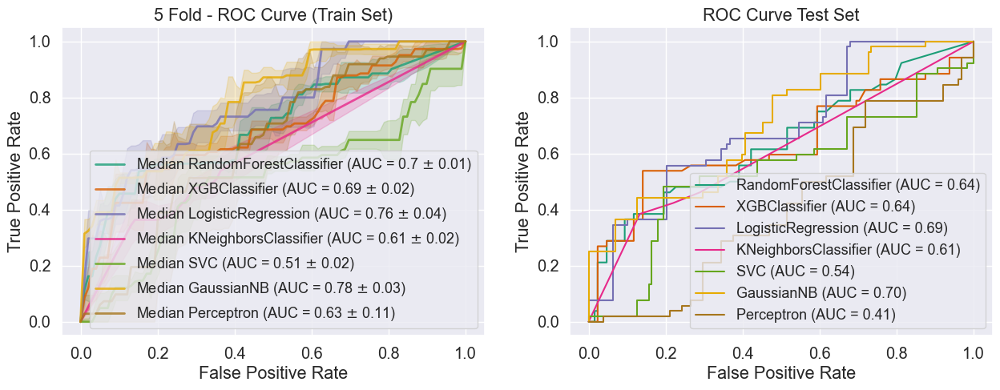

In [13]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss, roc_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

harvard_concat = harvard_concat.sample(900, random_state=42, replace=True)
triage_concat = triage_concat.sample(900, random_state=42, replace=True)

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(harvard_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'], test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(triage_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'], test_size=0.2, random_state=42)

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for i, model in enumerate(best_models):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_triage, y_train_triage)):
        model.fit(X_train_triage.iloc[train], y_train_triage.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_harvard.iloc[test],
            y_train_harvard.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_harvard.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_harvard.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_harvard.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_harvard.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_harvard.iloc[test], y_pred))
        auc_scores.append(viz.roc_auc)
        brierscores.append(brier_score_loss(y_train_harvard.iloc[test], y_pred))
    evaluation_train.loc[name] = [
        str(np.round(np.median(accuracy_scores), 2)) + " (" + str(np.round(np.std(accuracy_scores), 2)) + ")",
        str(np.round(np.median(precision_scores), 2)) + " (" + str(np.round(np.std(precision_scores), 2)) + ")",
        str(np.round(np.median(recall_scores), 2)) + " (" + str(np.round(np.std(recall_scores), 2)) + ")",
        str(np.round(np.median(f1_scores), 2)) + " (" + str(np.round(np.std(f1_scores), 2)) + ")",
        str(np.round(np.median(auc_scores), 2)) + " (" + str(np.round(np.std(auc_scores), 2)) + ")",
        str(np.round(np.median(brierscores), 2)) + " (" + str(np.round(np.std(brierscores), 2)) + ")",
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = auc(median_fpr, median_tpr)
    std_auc = np.std(aucs)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_harvard,
            y_test_harvard,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    roc_auc = viz.roc_auc
    y_pred = model.predict(X_test_harvard)
    evaluation_test.loc[name] = [
        np.round(accuracy_score(y_test_harvard, y_pred), 2),
        np.round(precision_score(y_test_harvard, y_pred),2),
        np.round(recall_score(y_test_harvard, y_pred),2),
        np.round(f1_score(y_test_harvard, y_pred),2),
        np.round(roc_auc,2),
        np.round(brier_score_loss(y_test_harvard, y_pred),2),
    ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

# view dataframe
from pandasgui import show
show(evaluation_train)
show(evaluation_test)



Fit Triage, pred Triage

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.



                           Accuracy    Precision       Recall           F1  \
RandomForestClassifier  0.78 (0.02)   0.75 (0.1)  0.36 (0.04)  0.45 (0.04)   
XGBClassifier           0.74 (0.03)  0.55 (0.08)  0.32 (0.06)  0.43 (0.05)   
LogisticRegression      0.74 (0.02)   0.6 (0.04)  0.34 (0.09)  0.41 (0.07)   
KNeighborsClassifier    0.69 (0.02)  0.45 (0.03)  0.41 (0.08)  0.43 (0.06)   
SVC                      0.7 (0.02)  0.46 (0.07)  0.24 (0.03)   0.3 (0.03)   
GaussianNB              0.76 (0.03)  0.63 (0.08)   0.4 (0.07)   0.5 (0.07)   
Perceptron              0.71 (0.05)   0.4 (0.24)  0.39 (0.29)  0.43 (0.25)   

                                AUC   Brier Loss  
RandomForestClassifier    1.0 (0.0)  0.22 (0.02)  
XGBClassifier             1.0 (0.0)  0.26 (0.03)  
LogisticRegression      0.88 (0.01)  0.26 (0.02)  
KNeighborsClassifier    0.99 (0.01)  0.31 (0.02)  
SVC                      1.0 (0.02)   0.3 (0.02)  
GaussianNB              0.89 (0.02)  0.24 (0.03)  
Perceptron        

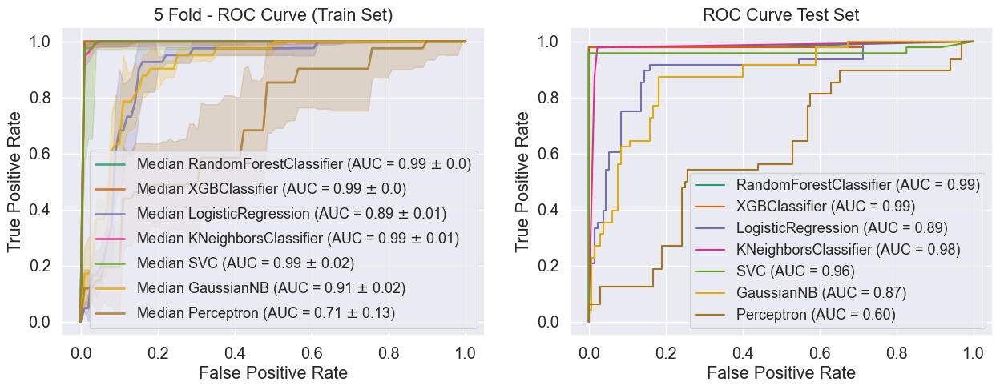

In [19]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss, roc_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

harvard_concat = harvard_concat.sample(900, random_state=42, replace=True)
triage_concat = triage_concat.sample(900, random_state=42, replace=True)

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(harvard_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'], test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(triage_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'], test_size=0.2, random_state=42)

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for i, model in enumerate(best_models):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_triage, y_train_triage)):
        model.fit(X_train_triage.iloc[train], y_train_triage.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_triage.iloc[test],
            y_train_triage.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_harvard.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_triage.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_triage.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_triage.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_triage.iloc[test], y_pred))
        auc_scores.append(viz.roc_auc)
        brierscores.append(brier_score_loss(y_train_triage.iloc[test], y_pred))
    evaluation_train.loc[name] = [
        str(np.round(np.median(accuracy_scores), 2)) + " (" + str(np.round(np.std(accuracy_scores), 2)) + ")",
        str(np.round(np.median(precision_scores), 2)) + " (" + str(np.round(np.std(precision_scores), 2)) + ")",
        str(np.round(np.median(recall_scores), 2)) + " (" + str(np.round(np.std(recall_scores), 2)) + ")",
        str(np.round(np.median(f1_scores), 2)) + " (" + str(np.round(np.std(f1_scores), 2)) + ")",
        str(np.round(np.median(auc_scores), 2)) + " (" + str(np.round(np.std(auc_scores), 2)) + ")",
        str(np.round(np.median(brierscores), 2)) + " (" + str(np.round(np.std(brierscores), 2)) + ")",
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = auc(median_fpr, median_tpr)
    std_auc = np.std(aucs)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_triage,
            y_test_triage,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    roc_auc = viz.roc_auc
    y_pred = model.predict(X_test_triage)
    evaluation_test.loc[name] = [
        np.round(accuracy_score(y_test_triage, y_pred),2),
        np.round(precision_score(y_test_triage, y_pred),2),
        np.round(recall_score(y_test_triage, y_pred),2),
        np.round(f1_score(y_test_triage, y_pred),2),
        np.round(roc_auc,2),
        np.round(brier_score_loss(y_test_triage, y_pred),2),
    ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

print(evaluation_train)
print(evaluation_test)

## Fit Harvard, pred Triage

PandasGUI INFO — pandasgui.gui — Opening PandasGUI
PandasGUI INFO — pandasgui.gui — Opening PandasGUI


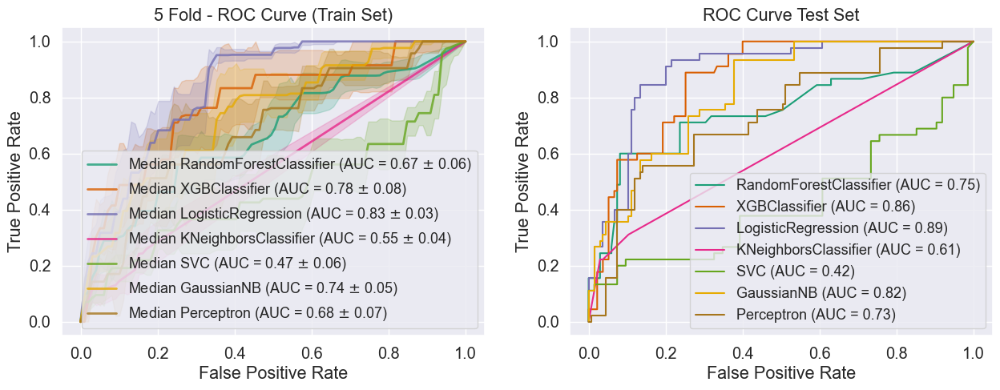

In [17]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss, roc_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

harvard_concat = harvard_concat.sample(900, random_state=42, replace=True)
triage_concat = triage_concat.sample(900, random_state=42, replace=True)

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(harvard_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'], test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(triage_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'], test_size=0.2, random_state=42)

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for i, model in enumerate(best_models):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_harvard, y_train_harvard)):
        model.fit(X_train_harvard.iloc[train], y_train_harvard.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_triage.iloc[test],
            y_train_triage.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_triage.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_triage.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_triage.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_triage.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_triage.iloc[test], y_pred))
        auc_scores.append(viz.roc_auc)
        brierscores.append(brier_score_loss(y_train_triage.iloc[test], y_pred))
    evaluation_train.loc[name] = [
        str(np.round(np.median(accuracy_scores), 2)) + " (" + str(np.round(np.std(accuracy_scores), 2)) + ")",
        str(np.round(np.median(precision_scores), 2)) + " (" + str(np.round(np.std(precision_scores), 2)) + ")",
        str(np.round(np.median(recall_scores), 2)) + " (" + str(np.round(np.std(recall_scores), 2)) + ")",
        str(np.round(np.median(f1_scores), 2)) + " (" + str(np.round(np.std(f1_scores), 2)) + ")",
        str(np.round(np.median(auc_scores), 2)) + " (" + str(np.round(np.std(auc_scores), 2)) + ")",
        str(np.round(np.median(brierscores), 2)) + " (" + str(np.round(np.std(brierscores), 2)) + ")",
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = auc(median_fpr, median_tpr)
    std_auc = np.std(aucs)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_triage,
            y_test_triage,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    roc_auc = viz.roc_auc
    y_pred = model.predict(X_test_triage)
    evaluation_test.loc[name] = [
        np.round(accuracy_score(y_test_triage, y_pred),2),
        np.round(precision_score(y_test_triage, y_pred),2),
        np.round(recall_score(y_test_triage, y_pred),2),
        np.round(f1_score(y_test_triage, y_pred),2),
        np.round(roc_auc,2),
        np.round(brier_score_loss(y_test_triage, y_pred),2),
    ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

# print dataframe to debug console without wrapping
show(evaluation_train)
show(evaluation_test)

## Fit Harvard Pred Harvard

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.

PandasGUI INFO — pandasgui.gui — Opening PandasGUI
PandasGUI INFO — pandasgui.gui — Opening PandasGUI


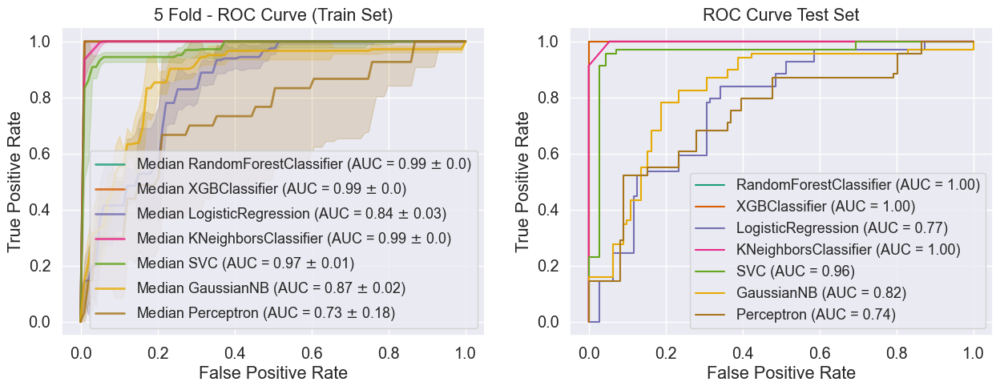

In [18]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss, roc_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

harvard_concat = harvard_concat.sample(900, random_state=42, replace=True)
triage_concat = triage_concat.sample(900, random_state=42, replace=True)

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(harvard_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'], test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(triage_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'], test_size=0.2, random_state=42)

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for i, model in enumerate(best_models):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_triage, y_train_triage)):
        model.fit(X_train_harvard.iloc[train], y_train_harvard.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_harvard.iloc[test],
            y_train_harvard.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_harvard.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_harvard.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_harvard.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_harvard.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_harvard.iloc[test], y_pred))
        auc_scores.append(viz.roc_auc)
        brierscores.append(brier_score_loss(y_train_harvard.iloc[test], y_pred))
    evaluation_train.loc[name] = [
        str(np.round(np.median(accuracy_scores), 2)) + " (" + str(np.round(np.std(accuracy_scores), 2)) + ")",
        str(np.round(np.median(precision_scores), 2)) + " (" + str(np.round(np.std(precision_scores), 2)) + ")",
        str(np.round(np.median(recall_scores), 2)) + " (" + str(np.round(np.std(recall_scores), 2)) + ")",
        str(np.round(np.median(f1_scores), 2)) + " (" + str(np.round(np.std(f1_scores), 2)) + ")",
        str(np.round(np.median(auc_scores), 2)) + " (" + str(np.round(np.std(auc_scores), 2)) + ")",
        str(np.round(np.median(brierscores), 2)) + " (" + str(np.round(np.std(brierscores), 2)) + ")",
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = auc(median_fpr, median_tpr)
    std_auc = np.std(aucs)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_harvard,
            y_test_harvard,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    roc_auc = viz.roc_auc
    y_pred = model.predict(X_test_harvard)
    evaluation_test.loc[name] = [
        np.round(accuracy_score(y_test_harvard, y_pred), 2),
        np.round(precision_score(y_test_harvard, y_pred),2),
        np.round(recall_score(y_test_harvard, y_pred),2),
        np.round(f1_score(y_test_harvard, y_pred),2),
        np.round(roc_auc,2),
        np.round(brier_score_loss(y_test_harvard, y_pred),2),
    ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

show(evaluation_train)
show(evaluation_test)

## Gridsearch Triage Concat

In [7]:
from imblearn.pipeline import Pipeline as imbpipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, Normalizer, MaxAbsScaler
from sklearn.feature_selection import f_classif
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split

X_harvard = triage_concat.drop(['Exacerbation'], axis=1)
y_harvard = triage_concat['Exacerbation']

# try prediction
X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(X_harvard, y_harvard, test_size=0.2, random_state=42, stratify=y_harvard, shuffle=True)



param_grids = [
    # RandomForestClassifier
    {
        'scaler': [StandardScaler(), MinMaxScaler(), Normalizer(), MaxAbsScaler()],
        'clf__n_estimators': [30,50,100, 300, 500 ],
        'clf__max_depth': [3, 5, 7, 9],
    }, 
    # XGBClassifier
    {
        'scaler': [StandardScaler(), MinMaxScaler(), Normalizer(), MaxAbsScaler()],
        'clf__n_estimators': [30,50,100, 300, 500 ],
        'clf__max_depth': [3, 5, 7, 9],
        "clf__learning_rate": [0.01, 0.05, 0.1, 0.2, 0.3],
    }, 
    # Logistic Regression
    {
        'scaler': [StandardScaler(), MinMaxScaler(), Normalizer(), MaxAbsScaler()],
        "clf__solver": ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
        "clf__C": [0.01, 0.1, 1, 10, 100],
    },
    # # KNN
    {
        'scaler': ["passthrough", StandardScaler(), MinMaxScaler(), Normalizer(), MaxAbsScaler()],
        "clf__n_neighbors": [3, 5, 7, 9],
    },
    # SVM
    {
        'scaler': ["passthrough", StandardScaler(), MinMaxScaler(), Normalizer(), MaxAbsScaler()],
        "clf__kernel": ['linear', 'poly', 'rbf', 'sigmoid'],
        "clf__C": [0.01, 0.1, 1, 10, 100],
    },
    # Naive Bayes
    {
        'scaler': ["passthrough", StandardScaler(), MinMaxScaler(), Normalizer(), MaxAbsScaler()],
    },
]

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
best_models_triage = []
classifiers = [
               RandomForestClassifier(random_state=42, n_jobs=-1), 
               XGBClassifier(random_state=42, n_jobs=-1), 
               LogisticRegression(random_state=42, n_jobs=-1), 
               KNeighborsClassifier(n_jobs=-1),
               SVC(random_state=42, probability=True),
               GaussianNB(),
               ]
classifier_cv_results = []
for i, classifier in enumerate(classifiers):
    pipeline = imbpipeline(steps = [
        ['scaler', StandardScaler()],
        ['clf', classifier]
    ])


    param_grid = param_grids[i]
    grid_search = GridSearchCV(estimator=pipeline,
                            param_grid=param_grid,
                            scoring='roc_auc',
                            cv=stratified_kfold,  
                            return_train_score=True, 
                            verbose=1,
                            n_jobs=-1,
                            refit=True
    )

    grid_search.fit(X_train_harvard, y_train_harvard)
    cv_results = pd.DataFrame(grid_search.cv_results_)
    classifier_cv_results.append(cv_results)
    # shorten the name of the hyperparameters
    # cv_results.columns = [shorten_param(col) for col in cv_results.columns]
    # # deal with None value for PCA
    # cv_results = cv_results.fillna(0)
    print("Results for " + str(classifier) + ":")
    print(grid_search.best_params_)
    print(grid_search.best_score_)
    print(grid_search.best_estimator_)
    best_models_triage.append(grid_search.best_estimator_)

    

Fitting 5 folds for each of 80 candidates, totalling 400 fits
Results for RandomForestClassifier(n_jobs=-1, random_state=42):
{'clf__max_depth': 3, 'clf__n_estimators': 300, 'scaler': Normalizer()}
0.7129349728285899
Pipeline(steps=[('scaler', Normalizer()),
                ['clf',
                 RandomForestClassifier(max_depth=3, n_estimators=300,
                                        n_jobs=-1, random_state=42)]])
Fitting 5 folds for each of 400 candidates, totalling 2000 fits
Results for XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              m

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.
  warnings.warn(


Results for LogisticRegression(n_jobs=-1, random_state=42):
{'clf__C': 10, 'clf__solver': 'liblinear', 'scaler': MaxAbsScaler()}
0.7475966027253821
Pipeline(steps=[('scaler', MaxAbsScaler()),
                ['clf',
                 LogisticRegression(C=10, n_jobs=-1, random_state=42,
                                    solver='liblinear')]])
Fitting 5 folds for each of 20 candidates, totalling 100 fits
Results for KNeighborsClassifier(n_jobs=-1):
{'clf__n_neighbors': 9, 'scaler': MinMaxScaler()}
0.690368474377433
Pipeline(steps=[('scaler', MinMaxScaler()),
                ['clf', KNeighborsClassifier(n_jobs=-1, n_neighbors=9)]])
Fitting 5 folds for each of 100 candidates, totalling 500 fits
Results for SVC(probability=True, random_state=42):
{'clf__C': 100, 'clf__kernel': 'linear', 'scaler': 'passthrough'}
0.7397533000780482
Pipeline(steps=[('scaler', 'passthrough'),
                ['clf',
                 SVC(C=100, kernel='linear', probability=True,
                     random_stat

## Fit Triage Eval Harvard

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:

                           Accuracy    Precision       Recall           F1  \
RandomForestClassifier  0.71 (0.03)  0.47 (0.07)  0.37 (0.08)  0.43 (0.07)   
XGBClassifier           0.71 (0.03)  0.46 (0.09)  0.38 (0.06)  0.42 (0.04)   
LogisticRegression      0.74 (0.03)  0.56 (0.03)   0.49 (0.1)  0.52 (0.07)   
KNeighborsClassifier    0.68 (0.04)   0.43 (0.1)  0.31 (0.11)  0.36 (0.11)   
SVC                     0.76 (0.03)  0.58 (0.04)   0.55 (0.1)  0.58 (0.07)   
GaussianNB              0.74 (0.05)  0.59 (0.07)  0.49 (0.11)  0.53 (0.09)   

                                AUC   Brier Loss  
RandomForestClassifier  0.79 (0.03)  0.29 (0.03)  
XGBClassifier           0.69 (0.04)  0.29 (0.03)  
LogisticRegression      0.81 (0.04)  0.26 (0.03)  
KNeighborsClassifier     0.6 (0.06)  0.32 (0.04)  
SVC                     0.82 (0.03)  0.24 (0.03)  
GaussianNB              0.79 (0.05)  0.26 (0.05)  
                        Accuracy  Precision  Recall    F1   AUC  Brier Loss
RandomForestClassifi

PandasGUI INFO — pandasgui.gui — Opening PandasGUI


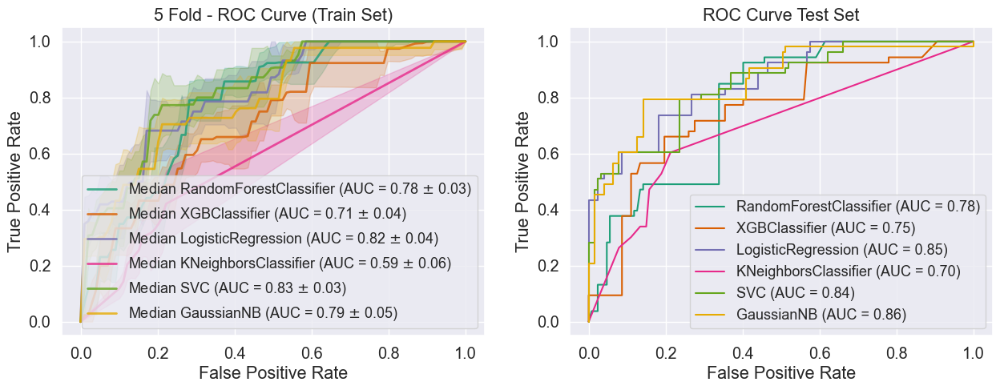

In [21]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss, roc_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

harvard_concat = harvard_concat.sample(900, random_state=42, replace=True)
triage_concat = triage_concat.sample(900, random_state=42, replace=True)

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(harvard_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'], test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(triage_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'], test_size=0.2, random_state=42)

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for i, model in enumerate(best_models_triage):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_triage, y_train_triage)):
        model.fit(X_train_triage.iloc[train], y_train_triage.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_harvard.iloc[test],
            y_train_harvard.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_harvard.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_harvard.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_harvard.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_harvard.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_harvard.iloc[test], y_pred))
        auc_scores.append(viz.roc_auc)
        brierscores.append(brier_score_loss(y_train_harvard.iloc[test], y_pred))
    evaluation_train.loc[name] = [
        str(np.round(np.median(accuracy_scores), 2)) + " (" + str(np.round(np.std(accuracy_scores), 2)) + ")",
        str(np.round(np.median(precision_scores), 2)) + " (" + str(np.round(np.std(precision_scores), 2)) + ")",
        str(np.round(np.median(recall_scores), 2)) + " (" + str(np.round(np.std(recall_scores), 2)) + ")",
        str(np.round(np.median(f1_scores), 2)) + " (" + str(np.round(np.std(f1_scores), 2)) + ")",
        str(np.round(np.median(auc_scores), 2)) + " (" + str(np.round(np.std(auc_scores), 2)) + ")",
        str(np.round(np.median(brierscores), 2)) + " (" + str(np.round(np.std(brierscores), 2)) + ")",
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = auc(median_fpr, median_tpr)
    std_auc = np.std(aucs)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_harvard,
            y_test_harvard,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    roc_auc = viz.roc_auc
    y_pred = model.predict(X_test_harvard)
    evaluation_test.loc[name] = [
        np.round(accuracy_score(y_test_harvard, y_pred), 2),
        np.round(precision_score(y_test_harvard, y_pred),2),
        np.round(recall_score(y_test_harvard, y_pred),2),
        np.round(f1_score(y_test_harvard, y_pred),2),
        np.round(roc_auc,2),
        np.round(brier_score_loss(y_test_harvard, y_pred),2),
    ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

print(evaluation_train)
print(evaluation_test)
show(evaluation_train)
show(evaluation_test)

## Fit Triage Eval Triage

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.
  warnings.warn(
c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.
  warnings.warn(
c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.
  warnings.warn(
c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.
  warnings.warn(
c:\Users\Daniel\AppData\Local\Programs\Python\Py

                        Accuracy  Precision    Recall        F1       AUC  \
RandomForestClassifier  0.798611   0.857143  0.064516  0.121212  0.532258   
XGBClassifier           0.798611   0.625000  0.161290  0.256410  0.567371   
LogisticRegression      0.777778   0.500000  0.125000  0.200000  0.537946   
KNeighborsClassifier    0.777778   0.500000  0.375000  0.451613  0.647321   
SVC                     0.777778   0.333333  0.031250  0.058824  0.507279   
GaussianNB              0.777778   0.500000  0.218750  0.304348  0.578125   

                        Brier Loss  
RandomForestClassifier    0.201389  
XGBClassifier             0.201389  
LogisticRegression        0.222222  
KNeighborsClassifier      0.222222  
SVC                       0.222222  
GaussianNB                0.222222  
                        Accuracy  Precision  Recall    F1   AUC  Brier Loss
RandomForestClassifier      0.83       1.00    0.12  0.21  0.82        0.17
XGBClassifier               0.83       0.80    0.

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


NameError: name 'show' is not defined

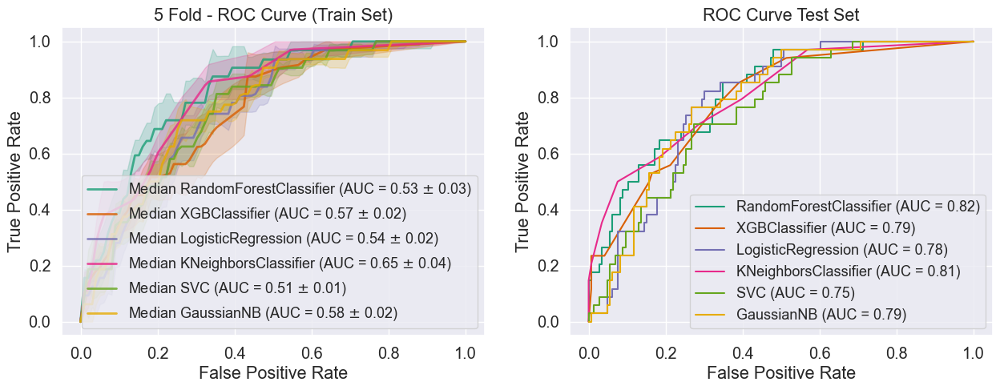

In [8]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss, roc_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

harvard_concat = harvard_concat.sample(900, random_state=42, replace=True)
triage_concat = triage_concat.sample(900, random_state=42, replace=True)

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(harvard_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'], test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(triage_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'], test_size=0.2, random_state=42)

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for i, model in enumerate(best_models_triage):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_harvard, y_train_harvard)):
        model.fit(X_train_triage.iloc[train], y_train_triage.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_triage.iloc[test],
            y_train_triage.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_triage.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_triage.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_triage.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_triage.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_triage.iloc[test], y_pred))
        # auc_scores.append(viz.roc_auc)
        auc = roc_auc_score(y_train_triage.iloc[test], y_pred)
        auc_scores.append(auc)
        brierscores.append(brier_score_loss(y_train_triage.iloc[test], y_pred))
    evaluation_train.loc[name] = [
        np.median(accuracy_scores),
        np.median(precision_scores),
        np.median(recall_scores),
        np.median(f1_scores),
        np.median(auc_scores),
        np.median(brierscores),
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = np.median(auc_scores)
    std_auc = np.std(auc_scores)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_triage,
            y_test_triage,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    roc_auc = viz.roc_auc
    y_pred = model.predict(X_test_triage)
    evaluation_test.loc[name] = [
        np.round(accuracy_score(y_test_triage, y_pred),2),
        np.round(precision_score(y_test_triage, y_pred),2),
        np.round(recall_score(y_test_triage, y_pred),2),
        np.round(f1_score(y_test_triage, y_pred),2),
        np.round(roc_auc,2),
        np.round(brier_score_loss(y_test_triage, y_pred),2),
    ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

print(evaluation_train)
print(evaluation_test)


In [9]:
from pandasgui import show
show(evaluation_train)
show(evaluation_test)

PandasGUI INFO — pandasgui.gui — Opening PandasGUI
PandasGUI INFO — pandasgui.gui — Opening PandasGUI


## Fit Harvard Eval Triage

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:

                           Accuracy    Precision       Recall           F1  \
RandomForestClassifier  0.76 (0.01)  0.38 (0.21)  0.06 (0.03)  0.11 (0.06)   
XGBClassifier           0.76 (0.02)  0.27 (0.18)   0.09 (0.1)  0.13 (0.13)   
LogisticRegression      0.78 (0.02)  0.57 (0.11)  0.18 (0.05)  0.27 (0.07)   
KNeighborsClassifier    0.74 (0.03)  0.36 (0.11)  0.15 (0.06)  0.21 (0.07)   
SVC                     0.78 (0.02)  0.71 (0.12)  0.29 (0.09)   0.39 (0.1)   
GaussianNB              0.76 (0.01)  0.33 (0.17)  0.03 (0.03)  0.05 (0.05)   

                                AUC   Brier Loss  
RandomForestClassifier  0.52 (0.02)  0.24 (0.01)  
XGBClassifier           0.51 (0.03)  0.24 (0.02)  
LogisticRegression      0.56 (0.02)  0.22 (0.02)  
KNeighborsClassifier    0.53 (0.04)  0.26 (0.03)  
SVC                     0.61 (0.03)  0.22 (0.02)  
GaussianNB              0.51 (0.01)  0.24 (0.01)  
                        Accuracy  Precision  Recall    F1   AUC  Brier Loss
RandomForestClassifi

PandasGUI INFO — pandasgui.gui — Opening PandasGUI


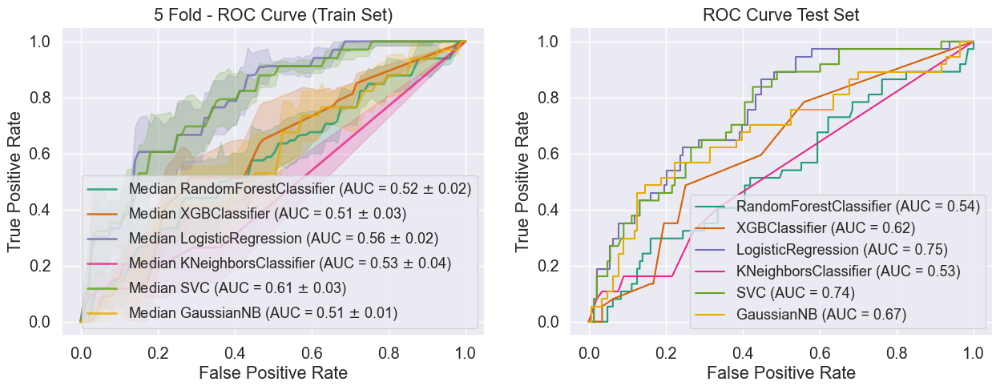

In [10]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss, roc_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

harvard_concat = harvard_concat.sample(900, random_state=42, replace=True)
triage_concat = triage_concat.sample(900, random_state=42, replace=True)

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(harvard_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'], test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(triage_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'], test_size=0.2, random_state=42)

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for i, model in enumerate(best_models_triage):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_harvard, y_train_harvard)):
        model.fit(X_train_harvard.iloc[train], y_train_harvard.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_triage.iloc[test],
            y_train_triage.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_triage.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_triage.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_triage.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_triage.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_triage.iloc[test], y_pred))
        # auc_scores.append(viz.roc_auc)
        auc = roc_auc_score(y_train_triage.iloc[test], y_pred)
        auc_scores.append(auc)
        brierscores.append(brier_score_loss(y_train_triage.iloc[test], y_pred))
    evaluation_train.loc[name] = [
        str(np.round(np.median(accuracy_scores), 2)) + " (" + str(np.round(np.std(accuracy_scores), 2)) + ")",
        str(np.round(np.median(precision_scores), 2)) + " (" + str(np.round(np.std(precision_scores), 2)) + ")",
        str(np.round(np.median(recall_scores), 2)) + " (" + str(np.round(np.std(recall_scores), 2)) + ")",
        str(np.round(np.median(f1_scores), 2)) + " (" + str(np.round(np.std(f1_scores), 2)) + ")",
        str(np.round(np.median(auc_scores), 2)) + " (" + str(np.round(np.std(auc_scores), 2)) + ")",
        str(np.round(np.median(brierscores), 2)) + " (" + str(np.round(np.std(brierscores), 2)) + ")",
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = np.median(auc_scores)
    std_auc = np.std(auc_scores)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_triage,
            y_test_triage,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    roc_auc = viz.roc_auc
    y_pred = model.predict(X_test_triage)
    evaluation_test.loc[name] = [
        np.round(accuracy_score(y_test_triage, y_pred),2),
        np.round(precision_score(y_test_triage, y_pred),2),
        np.round(recall_score(y_test_triage, y_pred),2),
        np.round(f1_score(y_test_triage, y_pred),2),
        np.round(roc_auc,2),
        np.round(brier_score_loss(y_test_triage, y_pred),2),
    ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

print(evaluation_train)
print(evaluation_test)
show(evaluation_train)
show(evaluation_test)

## Fit Harvard Eval Harvard

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:

                           Accuracy    Precision       Recall           F1  \
RandomForestClassifier  0.85 (0.02)   1.0 (0.09)  0.41 (0.07)  0.58 (0.07)   
XGBClassifier           0.84 (0.02)  0.82 (0.06)  0.41 (0.05)  0.53 (0.06)   
LogisticRegression       0.8 (0.02)   0.7 (0.13)  0.21 (0.08)  0.33 (0.09)   
KNeighborsClassifier    0.92 (0.02)  0.85 (0.04)  0.88 (0.09)  0.84 (0.05)   
SVC                     0.76 (0.02)   0.5 (0.16)  0.32 (0.08)  0.37 (0.06)   
GaussianNB              0.78 (0.02)  0.55 (0.07)  0.32 (0.05)  0.41 (0.05)   

                                AUC   Brier Loss  
RandomForestClassifier  0.96 (0.01)  0.15 (0.02)  
XGBClassifier            0.9 (0.01)  0.16 (0.02)  
LogisticRegression      0.72 (0.01)   0.2 (0.02)  
KNeighborsClassifier    0.96 (0.01)  0.08 (0.02)  
SVC                     0.71 (0.01)  0.24 (0.02)  
GaussianNB              0.66 (0.03)  0.22 (0.02)  
                        Accuracy  Precision  Recall    F1   AUC  Brier Loss
RandomForestClassifi

PandasGUI INFO — pandasgui.gui — Opening PandasGUI


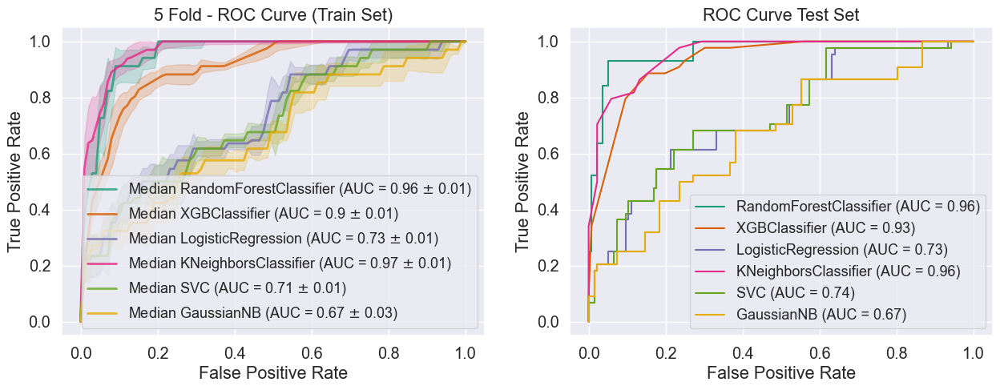

In [11]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss, roc_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

harvard_concat = harvard_concat.sample(900, random_state=42, replace=True)
triage_concat = triage_concat.sample(900, random_state=42, replace=True)

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(harvard_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'], test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(triage_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'], test_size=0.2, random_state=42)

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for i, model in enumerate(best_models_triage):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_triage, y_train_triage)):
        model.fit(X_train_harvard.iloc[train], y_train_harvard.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_harvard.iloc[test],
            y_train_harvard.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_harvard.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_harvard.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_harvard.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_harvard.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_harvard.iloc[test], y_pred))
        auc_scores.append(viz.roc_auc)
        brierscores.append(brier_score_loss(y_train_harvard.iloc[test], y_pred))
    evaluation_train.loc[name] = [
        str(np.round(np.median(accuracy_scores), 2)) + " (" + str(np.round(np.std(accuracy_scores), 2)) + ")",
        str(np.round(np.median(precision_scores), 2)) + " (" + str(np.round(np.std(precision_scores), 2)) + ")",
        str(np.round(np.median(recall_scores), 2)) + " (" + str(np.round(np.std(recall_scores), 2)) + ")",
        str(np.round(np.median(f1_scores), 2)) + " (" + str(np.round(np.std(f1_scores), 2)) + ")",
        str(np.round(np.median(auc_scores), 2)) + " (" + str(np.round(np.std(auc_scores), 2)) + ")",
        str(np.round(np.median(brierscores), 2)) + " (" + str(np.round(np.std(brierscores), 2)) + ")",
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = auc(median_fpr, median_tpr)
    std_auc = np.std(aucs)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_harvard,
            y_test_harvard,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    roc_auc = viz.roc_auc
    y_pred = model.predict(X_test_harvard)
    evaluation_test.loc[name] = [
        np.round(accuracy_score(y_test_harvard, y_pred), 2),
        np.round(precision_score(y_test_harvard, y_pred),2),
        np.round(recall_score(y_test_harvard, y_pred),2),
        np.round(f1_score(y_test_harvard, y_pred),2),
        np.round(roc_auc,2),
        np.round(brier_score_loss(y_test_harvard, y_pred),2),
    ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

print(evaluation_train)
print(evaluation_test)
show(evaluation_train)
show(evaluation_test)

# Merged Fitting

# Dimensionality Reduction

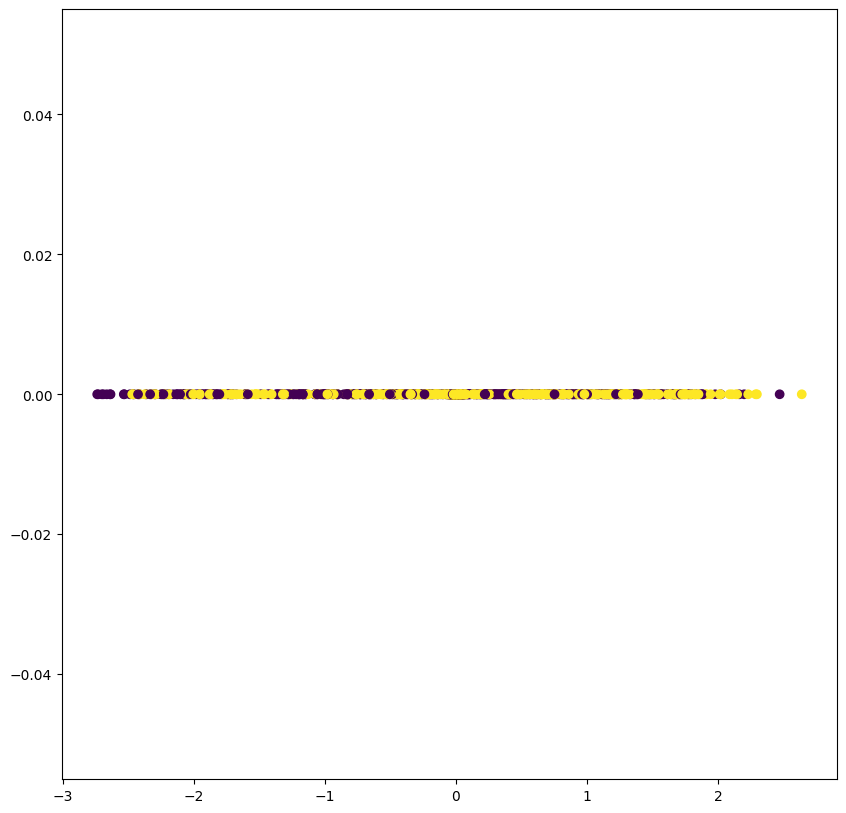

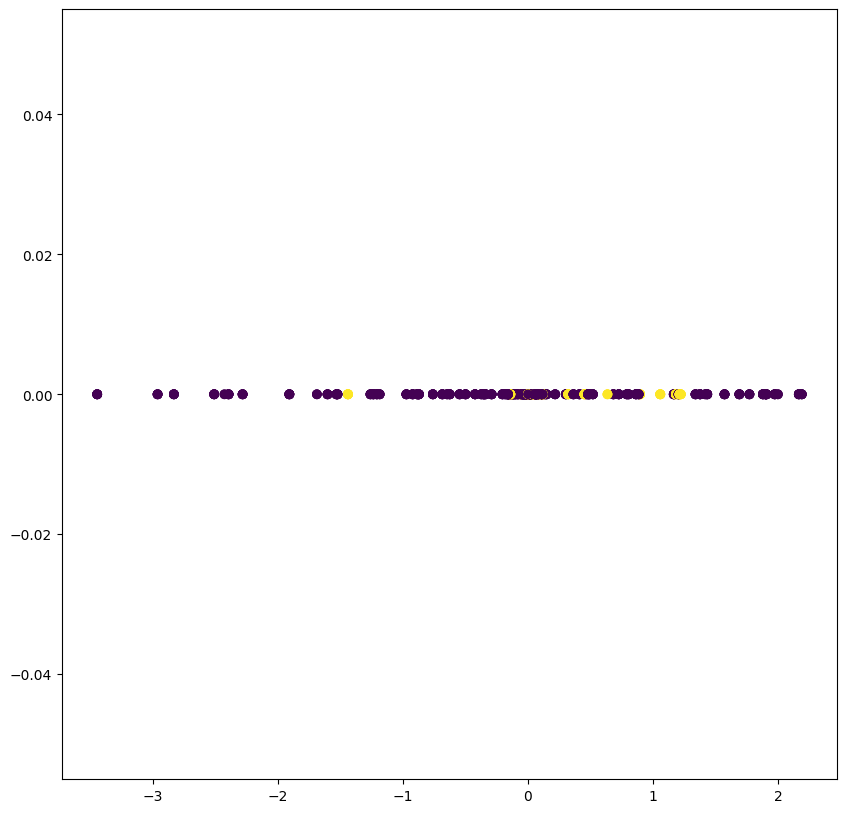

In [11]:
from sklearn.decomposition import PCA
import umap
from imblearn.over_sampling import SMOTE
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

candidate_values = ['% FEV1 b', 'Weight', 'Exacerbation'] #'BMI', 'Weight', 'GOLD'
features = candidate_values[:-1]
df_triage_copy = df_triage.copy()
df_triage_copy.fillna(df_triage_copy.mean(), inplace=True)
df_harvard_copy = df_harvard.copy()
df_harvard_copy.fillna(df_harvard_copy.mean(), inplace=True)
subset_triage = df_triage_copy[candidate_values]
subset_harvard = df_harvard_copy[candidate_values]



# smote = SMOTE()
# subset_triage, y_triage = smote.fit_resample(subset_triage, subset_triage['Exacerbation'])
# subset_triage = pd.DataFrame(subset_triage, columns=candidate_values)
# subset_triage['Exacerbation'] = y_triage

# subset_harvard, y_harvard = smote.fit_resample(subset_harvard, subset_harvard['Exacerbation'])
# subset_harvard = pd.DataFrame(subset_harvard, columns=candidate_values)
# subset_harvard['Exacerbation'] = y_harvard

# embedding = umap.UMAP(n_neighbors=10).fit_transform(subset_triage, y=subset_triage['Exacerbation'])
# plt.scatter(*embedding.T, c=subset_triage['Exacerbation'], cmap='Spectral', alpha=1.0)

# # apply quantile transformation to the data
# quantile_transformer = QuantileTransformer(output_distribution='uniform', random_state=42)
# subset_triage[features] = quantile_transformer.fit_transform(subset_triage[features])
# subset_harvard[features] = quantile_transformer.fit_transform(subset_harvard[features])
# # back to pandas
# subset_triage = pd.DataFrame(subset_triage, columns=candidate_values)
# subset_harvard = pd.DataFrame(subset_harvard, columns=candidate_values)

# pca = PCA(n_components=2)
# pca.fit(subset_triage[features])
# subset_triage_transformed = pca.transform(subset_triage[features])
# # add exacerbations back
# subset_triage_transformed = pd.DataFrame(subset_triage_transformed, columns=['PC1', 'PC2'], index=subset_triage.index)
# subset_triage_transformed['Exacerbation'] = subset_triage['Exacerbation']

# pca = PCA(n_components=2)
# pca.fit(subset_harvard[features])
# subset_harvard_transformed = pca.transform(subset_harvard[features])
# subset_harvard_transformed = pd.DataFrame(subset_harvard_transformed, columns=['PC1', 'PC2'], index=subset_harvard.index)
# subset_harvard_transformed['Exacerbation'] = subset_harvard['Exacerbation']

# subset_triage_transformed = umap.UMAP(n_neighbors=30, n_components=2, n_jobs=-1).fit_transform(subset_triage, y=subset_triage['Exacerbation'])
# subset_harvard_transformed = umap.UMAP(n_neighbors=30, n_components=2, n_jobs=-1).fit_transform(subset_harvard, y=subset_harvard['Exacerbation'])

lda = LinearDiscriminantAnalysis()
lda.fit(subset_triage[features], subset_triage['Exacerbation'])
subset_triage_transformed = lda.transform(subset_triage[features])
lda.fit(subset_harvard[features], subset_harvard['Exacerbation'])
subset_harvard_transformed = lda.transform(subset_harvard[features])



# back to dataframe
subset_triage_transformed = pd.DataFrame(subset_triage_transformed, columns=['PC1'], index=subset_triage.index)
subset_triage_transformed['Exacerbation'] = subset_triage['Exacerbation']
subset_harvard_transformed = pd.DataFrame(subset_harvard_transformed, columns=['PC1'], index=subset_harvard.index)
subset_harvard_transformed['Exacerbation'] = subset_harvard['Exacerbation']

# create 1D plot
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(subset_triage_transformed['PC1'], np.zeros(len(subset_triage_transformed)), c=subset_triage_transformed['Exacerbation'])

fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(subset_harvard_transformed['PC1'], np.zeros(len(subset_harvard_transformed)), c=subset_harvard_transformed['Exacerbation'])


# # create 2D plot
# fig, ax = plt.subplots(figsize=(10,10))
# ax.scatter(subset_triage_transformed['PC1'], subset_triage_transformed['PC2'], c=subset_triage_transformed['Exacerbation'])

# fig, ax = plt.subplots(figsize=(10,10))
# ax.scatter(subset_harvard_transformed['PC1'], subset_harvard_transformed['PC2'], c=subset_harvard_transformed['Exacerbation'])

# # create 3D scatter plot
# fig = plt.figure(figsize=(10,10))
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(subset_triage_transformed['PC1'], subset_triage_transformed['PC2'], subset_triage_transformed['PC3'], c=subset_triage_transformed['Exacerbation'])

# fig = plt.figure(figsize=(10,10))
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(subset_harvard_transformed['PC1'], subset_harvard_transformed['PC2'], subset_harvard_transformed['PC3'], c=subset_harvard_transformed['Exacerbation'])


# pca = PCA(n_components=3)
# pca.fit(subset_harvard[features])
# subset_harvard_transformed = pca.transform(subset_harvard[features])
# # add exacerbations back
# subset_harvard_transformed = pd.DataFrame(subset_harvard_transformed, columns=['PC1', 'PC2', 'PC3'], index=subset_harvard.index)
# subset_harvard_transformed['Exacerbation'] = subset_harvard['Exacerbation']


# print na
# print(subset_triage.isna().sum())
# print(subset_harvard.isna().sum())

# X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(subset_harvard_transformed.drop(columns=['Exacerbation']), subset_harvard_transformed['Exacerbation'], test_size=0.2, random_state=42)

# X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(subset_triage_transformed.drop(columns=['Exacerbation']), subset_triage_transformed['Exacerbation'], test_size=0.2, random_state=42)

# from lazypredict.Supervised import LazyClassifier
# clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
# models, predictions = clf.fit(X_train_triage, X_test_harvard, y_train_triage, y_test_harvard)
# print(models)

In [ ]:
# try dimensionality reduction
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import Isomap
import umap
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score
# pca = PCA(n_components=2)

df_harvard_copy = df_harvard.copy()
df_harvard_copy.fillna(df_harvard_copy.mean(), inplace=True)
df_triage_copy = df_triage.copy()
df_triage_copy.fillna(df_triage_copy.mean(), inplace=True)
X_harvard = df_harvard_copy.drop('Exacerbation', axis=1)
X_triage = df_triage_copy.drop('Exacerbation', axis=1)
y_harvard = df_harvard_copy['Exacerbation']
y_triage = df_triage_copy['Exacerbation']
# Standardize
scaler = StandardScaler()
# quantile_transformer = QuantileTransformer()
X_harvard_scaled = scaler.fit_transform(X_harvard)

# apply smote to harvard data
from imblearn.over_sampling import SMOTE
smote = SMOTE()
X_harvard_scaled, y_harvard = smote.fit_resample(X_harvard_scaled, y_harvard)

isomap = Isomap(n_components=3, n_neighbors=2)
X_harvard_transformed = isomap.fit_transform(X_harvard_scaled, y_harvard)
# 3D scatter plot
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_harvard_transformed[:,0], X_harvard_transformed[:,1], X_harvard_transformed[:,2], c=y_harvard)

# embedding_harvard = umap.UMAP(n_neighbors=15, n_components=3).fit_transform(X_harvard_scaled, y_harvard)
# embedding_triage = umap.UMAP(n_neighbors=15, n_components=3).fit_transform(df_triage_copy, y_triage)

# from lazypredict.Supervised import LazyClassifier
# from sklearn.model_selection import train_test_split

# X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(embedding_harvard, y_harvard, test_size=0.2)
# X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(embedding_triage, y_triage, test_size=0.2)
# clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
# # models_triage, predictions_triage = clf.fit(X_train_triage, X_test_triage, y_train_triage, y_test_triage)
# model_mixed, predictions_mixed = clf.fit(X_train_harvard, X_test_triage, y_train_harvard, y_test_triage)
# model_mixed
# model_mixed2, predictions_mixed2 = clf.fit(X_train_triage, X_test_harvard, y_train_triage, y_test_harvard)

# # create 2D plot
# fig, ax = plt.subplots(figsize=(10,10))
# ax.scatter(embedding_harvard[:,0], embedding_harvard[:,1], c=y_harvard)

# fig, ax = plt.subplots(figsize=(10,10))
# ax.scatter(embedding_triage[:,0], embedding_triage[:,1], c=y_triage)


# # create 3D scatter plot
# fig = plt.figure(figsize=(10,10))
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(embedding_harvard[:,0], embedding_harvard[:,1], embedding_harvard[:,2], c=y_harvard)

# fig = plt.figure(figsize=(10,10))
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(embedding_triage[:,0], embedding_triage[:,1], embedding_triage[:,2], c=y_triage)

# # pca.fit(X_harvard_scaled)
# # harvard_pca = pca.transform(X_harvard_scaled)
# # print(harvard_pca.shape)
# # plot the scatter plot. Color the points by the class
# plt.scatter(harvard_pca[:,0], harvard_pca[:,1], c=y_harvard)

# fig, ax = plt.subplots(figsize=(10,10))
# # now triage
# X_triage_scaled = scaler.fit_transform(X_triage)

# # pca.fit(X_triage_scaled)
# triage_pca = isomap.fit_transform(X_triage_scaled)
# plt.scatter(triage_pca[:,0], triage_pca[:,1], c=y_triage)

# Cycle GAN

In [ ]:
# import pandas as pd
# from keras.optimizers import Adam
# from keras.initializers import RandomNormal
# from keras.models import Model
# from tensorflow.keras.layers import Input
# from keras.layers import Conv1D
# from keras.layers import LeakyReLU
# from keras.layers import Activation
# from keras.layers import Concatenate
# from keras.layers import BatchNormalization
# from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
# from keras.utils.vis_utils import plot_model

In [ ]:
# # https://github.com/shreyas253/CycleGAN_1dCNN/tree/master


# # shape of the vector is 29x1

# # define the discriminator model
# def define_discriminator(image_shape):
#     # weight initialization
#     init = RandomNormal(stddev=0.02)
#     # source image input
#     in_image = Input(shape=image_shape)
#     # C64
#     d = Conv1D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(in_image)
#     d = LeakyReLU(alpha=0.2)(d)
#     # C128
#     d = Conv1D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
#     d = InstanceNormalization(axis=-1)(d)
#     d = LeakyReLU(alpha=0.2)(d)
#     # C256
#     d = Conv1D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
#     d = InstanceNormalization(axis=-1)(d)
#     d = LeakyReLU(alpha=0.2)(d)
#     # C512
#     d = Conv1D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
#     d = InstanceNormalization(axis=-1)(d)
#     d = LeakyReLU(alpha=0.2)(d)
#     # second last output layer
#     d = Conv1D(512, (4,4), padding='same', kernel_initializer=init)(d)
#     d = InstanceNormalization(axis=-1)(d)
#     d = LeakyReLU(alpha=0.2)(d)
#     # patch output
#     patch_out = Conv1D(1, (4,4), padding='same', kernel_initializer=init)(d)
#     # define model
#     model = Model(in_image, patch_out)
#     # compile model
#     model.compile(loss='mse', optimizer=Adam(lr=0.0002, beta_1=0.5), loss_weights=[0.5])
#     return model
 
# # define image shape
# image_shape = (256,256,3)
# # create the model
# model = define_discriminator(image_shape)
# # summarize the model
# model.summary()
# # plot the model
# plot_model(model, to_file='discriminator_model_plot.png', show_shapes=True, show_layer_names=True)